# PROJET ANALYSE DE DONNEES
## Etude des stations de location de vélos dans Paris

In [175]:
import pandas as pd
import numpy as np
import random as rd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import plotly.express as px
import plotly.express as px
import prince
from prince import CA
%matplotlib inline
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score 
from sklearn.metrics import confusion_matrix


Dans ce notebook, nous allons étudier un jeu de données contenant des informations concernant les taux de disponibilités des vélos dans des stations parisiennes.Nous avons accés à ce taux pour toutes les heures de chaque jour de la semaine sur la période du 2 septembre au 7 septembre 2014.

Une remarque importante pour comprendre au mieux le sujet est que plus le taux est proche de 1 plus la station a de vélos disponibles. Inversement, quand ce taux est proche de 0 alors il y a de moins en moins de vélos libres dans la station.

## 1. Présentation des données

Nous allons ici importer toutes les données mises à notre disposition.

In [ ]:
#loading = pd.read_csv('velibLoading.csv', sep = " ")
loading = pd.read_csv('data/velibLoading.csv', sep = " ")
loading

Il y a 168 colonnes qui représentent le total des heures dans une semaine. Les 1189 lignes correspondent aux données de toutes les stations de Paris que nous étudions ici.

In [ ]:
loading.describe()

Les 168 colonnes represéntent comme précedemment chaque heure d'une semaine. Les lignes correspondent à differentes données calculées sur toutes les stations chaque heure.

Nous allons maintenant importer les coordonnées géographiques de chaque station. 

In [ ]:
#coord = pd.read_csv('velibCoord.csv', sep = " ")
coord = pd.read_csv('data/velibCoord.csv', sep = " ")

coord.head()

Grace à la commande ".head", nous avons affiché seulement les 5 premières lignes du tableau "coord".

Nous regardons dans cette cellule si certaines données sont manquantes, si certaines cases sont vides. 

In [ ]:
print("Nombre de données manquantes dans 'loading':")
print(loading.isna().sum().sum())
print("Nombre de données manquantes dans 'coord':")
print(coord.isna().sum().sum())

Or ici, le résultat obtenu pour chaque tableau "loading" et "coord" est 0, il n'y a donc pas de donnée manquante ! 

In [ ]:
loading_missing_value = loading.isna().sum().sort_values(ascending=False)

print("--- Somme des valeurs manquantes dans 'Loading' ---")
print(loading_missing_value.sum())

# --- #
print('')

coord_missing_value = coord.isna().sum().sort_values(ascending=False)

print("--- Somme des valeurs manquantes dans 'Coord' ---")
print(coord_missing_value)

Nous affichons ici le nombre d'occurences de chaque station dans nos données.

In [ ]:
print("---Données duppliquées---")
station_name = coord.names.value_counts()
print(station_name)

Le tableau ci-dessous illustre le fait que le même si le nom de la station apparaît trois fois dans notre jeu de données, celle-ci ne correspon pas aux mêmes coordonnées géographiques. Cela nous montre bien qu'il ne faut pas supprimer des lignes car même si les stations ont le même nom elles n'ont pas les mêmes caractéristiques géographiques.

In [ ]:
name = station_name.index[0]
coord[coord.names == name]

## 2. Analyse descriptive des données

Afin de poursuivre notre analyse nous allons nous pencher sur le point de vue descriptif.

Observons tout d'abord que les différentes moyennes des stations ne sont pas du tout homogène, et qu'il est donc, intéressant de regarder d'un peu plus près les différentes moyennes observées pour avoir une vision globale de l'impact des heures, jours et de la localisation des stations sur la comportement d'utilisation.

En effet, dans le graphe suivant, il est possible de voir que le taux de chargement moyen varie grandement d'une station à une autre.

In [ ]:
loading_mean = pd.Series(loading.mean(axis=1))
# %load solutions/Python/plot_mean_stations.py
n_stations = loading.shape[0]  # number of observed stations
stations   = np.arange(n_stations)

plt.figure(figsize = (20,6))

# --- #

plt.plot(loading_mean)
plt.hlines(y = loading.mean().mean(), xmin=0, xmax=n_stations, 
           colors = "OrangeRed", linewidth = 3)

# --- #

plt.xlabel('Stations', fontsize = 20)
plt.ylabel('Average loading', fontsize = 20)
plt.title("Average loading per station", fontsize = 25)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

plt.tight_layout()
plt.show()

Pour visualiser un peu mieux ces taux de chargement on affiche aussi des taux pour 16 stations pris aléatoirement.

In [ ]:
stations = np.arange(loading.shape[0])
rd.shuffle(stations)
stations = stations[:16] 

# --- #
n_steps    = loading.shape[1] 
fig, axs = plt.subplots(4, 4, figsize = (15,12))
time_range = np.linspace(1, n_steps, n_steps) 


timeTick = np.arange(1, 25*7, 24)

for i in range(4):
    for j in range(4):
        k_station = stations[4 * i + j]
        axs[i, j].plot(time_range, loading.iloc[k_station, :], linewidth = 1, color = 'purple')
        axs[i, j].vlines(x = timeTick, ymin = 0, ymax = 1, colors = "orange", linestyle = "dotted", linewidth = 3)
        axs[i, j].set_title(coord.names[1 + k_station], fontsize = 12)

for ax in axs.flat:
    ax.set_xlabel('Time', fontsize = 12)
    ax.set_ylabel('Loading', fontsize = 12)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    
plt.tight_layout()
plt.show()

Dans un contexte un peu plus général, on affiche la moyenne de chargement totale sur toutes les stations au cours de la semaine.

In [ ]:
print(loading.mean().mean())

Ainsi, on peut dire qu'en moyenne, sur l'ensemble des stations parisiennes et sur une semaine, le taux de chargement moyen est de 0.39. Ce qui signifie qu'en moyenne il y a 4 vélos sur 10 disponibles dans les stations. 

On s'interesse maintenant au taux de chargement moyen dans tout Paris, sur la journée et pour chaque jour de la semaine.

=> légende du graphe ok?

In [ ]:
# On calcule la moyenne pour chaque jour de la semaine
mean_per_hour_per_day = loading.mean(axis = 0).to_numpy()
mean_per_hour_per_day = mean_per_hour_per_day.reshape((7, 24))

mean_per_hour = mean_per_hour_per_day.mean(axis=0)

# --- #

days = ["Lundi", "Mardi", "Mercredi", "Jeudi", "Vendredi", "Samedi", "Dimanche"]
plt.figure(figsize = (15,10))

plt.plot(mean_per_hour_per_day.transpose())
plt.plot(mean_per_hour, color = "black", linewidth = 3)

plt.xlabel('Chargement horaire, moyenne de toutes les stations', fontsize = 20)
plt.ylabel('Chargement', fontsize = 20)
plt.legend(days + ['Semaine'])
plt.xticks(ticks = np.arange(0,24,4), labels=np.arange(0,24,4), fontsize = 15)

plt.tight_layout
plt.show()


Ainsi, on peut voir qu'en moyenne, alentours de 2h-4h du matin les vélos ne sont pas beaucoup empruntés. Cependant, on peut voir qu'à 9h environ ils le sont davantage, idem entre 19h et 20h. Ce résultat s'explique par les heures de travail de la population qui part le matin en vélo et rentre en fin de journée. 

On souhaite savoir, en moyenne, quel est le jour de la semaine, durant lequel les gens utilisent le plus les vélos, on fait alors une moyenne sur tous les jours de la semaine pour chaque heure de la journée.

Regardons maintenant le comportement moyen des taux de chargements des stations à 18h pour chaque jour de la semaine. 

In [ ]:
# On calcule la moyenne pour chaque heure sur tous les jours de la semaine
mean_per_hour_per_day = loading.mean(axis = 0).to_numpy()
mean_per_hour_per_day = mean_per_hour_per_day.reshape((24, 7))

mean_per_hour = mean_per_hour_per_day.mean(axis=0)

# --- #
hours = ["0h", "1h", "2h","3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h"]
plt.figure(figsize = (20,10))

plt.plot(mean_per_hour_per_day.transpose())
plt.plot(mean_per_hour, color = "black", linewidth = 3)

plt.xlabel('Chargement horaire, moyenne de toutes les stations', fontsize = 15)
plt.ylabel('Chargement', fontsize = 20)
plt.legend(hours + ['hours'])
plt.xticks(ticks = np.arange(0,7,4), labels=np.arange(0,7,4), fontsize = 15)
  
plt.tight_layout
plt.show()

Ici, on voit qu'il n'y a pas vraiment de comportement qui se distinguent et qu'il n'y a donc pas de jour durant lequel on utilise plus le vélo.

On va maintenant regarder l'évolution du taux sur une station au hasard :

In [ ]:
plt.rcParams['figure.figsize'] = [15, 6]
time_range = np.arange(1, 25)

# on sélectionne aléatoirement un numéro d'un indice de ligne
i = np.random.randint(1, 1190) 

df = loading.iloc[i]

# Création d'une matrice de 24 lignes (une pour chaque heure)
mean_per_hour_per_day = np.array(df).reshape(24, -1)

# on calcul de la moyenne par heure
mean_per_hour = np.mean(mean_per_hour_per_day, axis=1)

# Conversion de la matrice en dataframe
mean_per_hour_per_day = pd.DataFrame(mean_per_hour_per_day)

# Renommage des colonnes avec les jours de la semaine
mean_per_hour_per_day.columns = ["Lundi", "Mardi", "Mercredi", "Jeudi", "Vendredi", "Samedi", "Dimanche"]

mean_per_hour_per_day['time_range'] = np.arange(1, 25)
mean_per_hour_per_day = pd.melt(mean_per_hour_per_day, id_vars='time_range', var_name='Days')
mean_per_hour = pd.DataFrame(mean_per_hour)

mean_per_hour.columns = ["Weekly"]

mean_per_hour['time_range'] = np.arange(1, 25)


for day in mean_per_hour_per_day['Days'].unique():
    plt.plot(mean_per_hour_per_day[mean_per_hour_per_day['Days'] == day]['time_range'], 
             mean_per_hour_per_day[mean_per_hour_per_day['Days'] == day]['value'], 
             label=day)

plt.plot(mean_per_hour['time_range'], mean_per_hour['Weekly'], color='black', linewidth=3, label='Weekly')

plt.title(coord.names[i])
plt.xlabel("Heure de la journée")
plt.ylabel("Chargement moyen")
plt.legend()
plt.show()


Regardons maintenant, quelle station est la plus fréquentée, en moyenne par semaine.

In [ ]:
mean=loading.mean(axis=1)
i = mean.idxmin()
print('Average fill rate :',mean[i])
print(coord.loc[i])

Et de même la station la moins fréquentée, en moyenne par semaine.

In [ ]:
mean=loading.mean(axis=1)
i = mean.idxmax()
print('Average fill rate :',mean[i])
print(coord.loc[i])

Regardons maintenant le comportement moyen des taux de chargements des stations à 18h pour chaque jour de la semaine. 

In [ ]:
#on affiche le comportement des chargements des stations à 18h chaque jour
loading_data = loading.to_numpy()

h = 18
hours = np.arange(h, 168, 24)

load_per_hour = loading_data[:, hours]

days = ["Lundi", "Mardi", "Mercredi", "Jeudi", "Vendredi", "Samedi", "Dimanche"]

# --- #

s, m = 10, 3
k = 1 + len(days)//m

fig = plt.figure(figsize=(s+1, s))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=.3, wspace=.25)

for (i,d) in enumerate(days):
    ax = fig.add_subplot(k, m, i+1)
    im = ax.scatter(coord.latitude, coord.longitude, c = load_per_hour[:,i], cmap = 'viridis')
    plt.colorbar(im)
    
    ax.set_title('Stations de chargement - ' + d + ' {} h'.format(h))
    ax.set_xlabel('Latitude')
    ax.set_ylabel('Longitude')
    ax.tick_params(axis='x')
    ax.tick_params(axis='y')

#plt.tight_layout()
plt.show()

ANALYSE :

In [ ]:
ib['names'][i])
     35 plt.xlabel("Hib['names'][i])
     35 plt.xlabel("Hib['names'][i])
     35 plt.xlabel("HOn regarde le comportement moyen par heure (toutes les 4h) sur l'ensemble des stations.

In [ ]:
#on affiche le comportement moyen par heure (toutes les 4h)

hours = [1, 5, 9, 13, 17, 21, 24]

# Taille de la figure et nombre de sous-graphiques
s = 10
n = len(hours)
num_rows = 2
num_cols = (n + num_rows - 1) // num_rows
fig, axs = plt.subplots(num_rows, num_cols, figsize=(s * num_cols, s * num_rows))

for i, h in enumerate(hours):
    load_per_hour = np.mean(loading.iloc[:, h::24], axis=1)  # Calcul de la moyenne pour chaque heure sur tous les jours de la semaine
    row = i // num_cols
    col = i % num_cols
    im = axs[row, col].scatter(coord.latitude, coord.longitude, c=load_per_hour, cmap=cm.plasma_r)
    axs[row, col].set_title('Chargement à {} h'.format(h), fontsize=25)
    plt.colorbar(im, ax=axs[row, col])

for ax in axs.flat:
    ax.set_xlabel('Latitude', fontsize=20)
    ax.set_ylabel('Longitude', fontsize=20)
    ax.tick_params(axis='x', labelsize=15)
    ax.tick_params(axis='y', labelsize=15)

plt.tight_layout()
plt.show()




ANALYSE

On fait ici la même chose que précédemment mais on projette les stations sur la carte de Paris, pour avoir une idée plus visuelle de leur localisation.

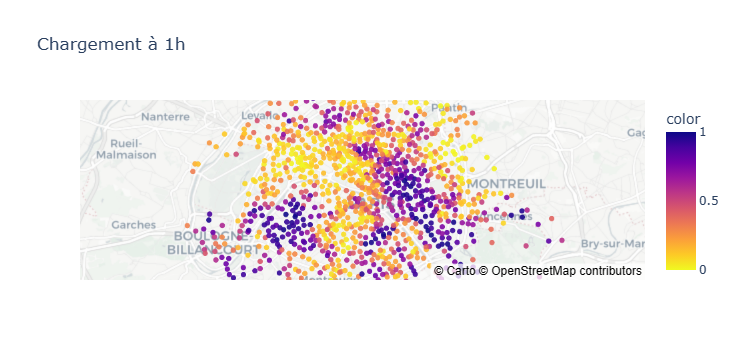

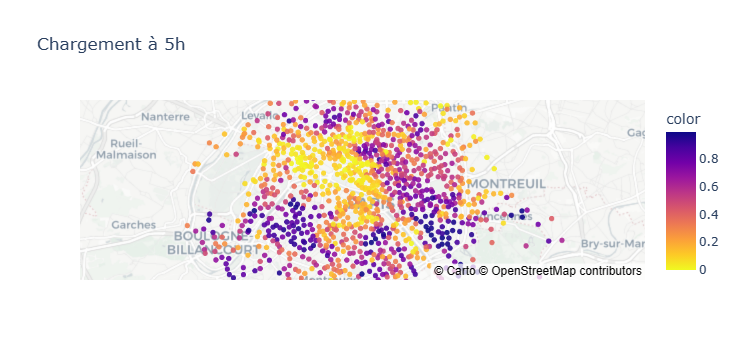

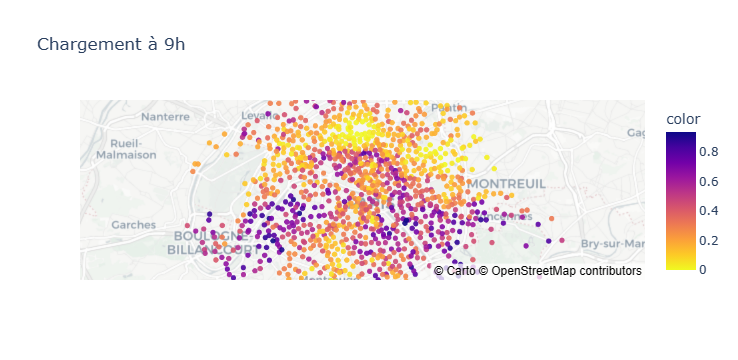

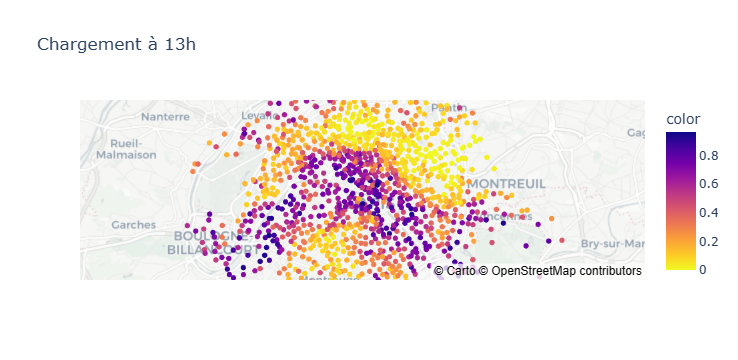

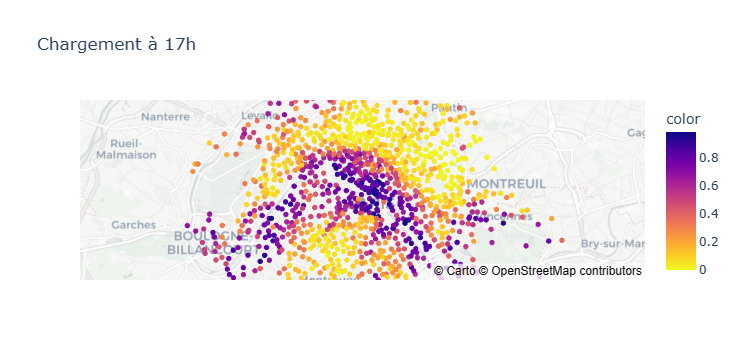

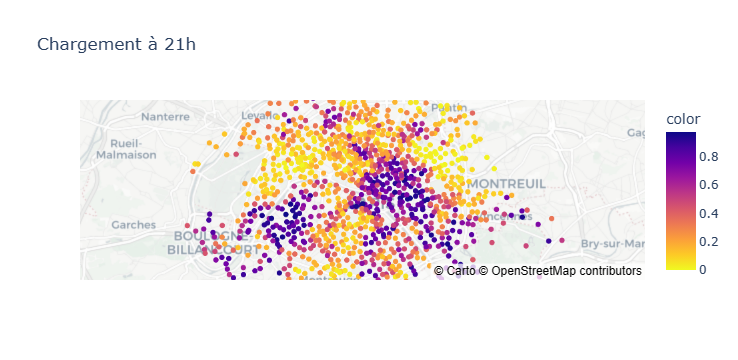

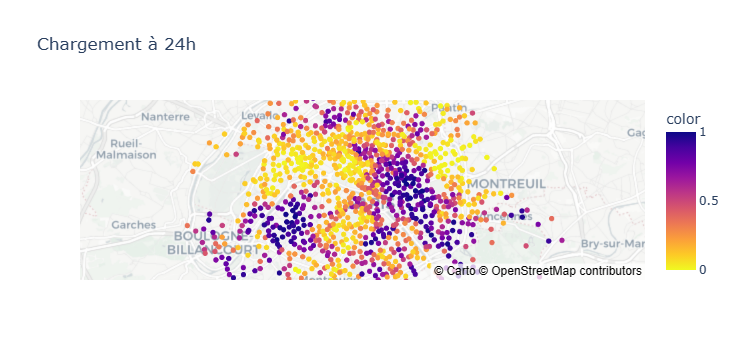

In [137]:

Position = np.array(coord)[:,0:2]

#graphe à 1h
a1 = np.arange(1,168,24, dtype=int)
data1h = np.mean(np.array(loading)[:,a1],axis=1)

fig1 = px.scatter_mapbox(data1h, Position[:,1], Position[:,0], color=data1h, color_continuous_scale = px.colors.sequential.Plasma_r, 
                        size_max=15, zoom=10,mapbox_style="carto-positron", opacity = .9,
                        title = 'Chargement à 1h')
fig1.show()

a5 = np.arange(5,168,24, dtype=int)
data5h = np.mean(np.array(loading)[:,a5],axis=1)

fig5 = px.scatter_mapbox(data5h, Position[:,1], Position[:,0], color=data5h, color_continuous_scale = px.colors.sequential.Plasma_r, 
                        size_max=15, zoom=10,mapbox_style="carto-positron", opacity = .9,
                        title = 'Chargement à 5h')
fig5.show()

a9 = np.arange(9,168,24, dtype=int)
data9h = np.mean(np.array(loading)[:,a9],axis=1)

fig9 = px.scatter_mapbox(data9h, Position[:,1], Position[:,0], color=data9h, color_continuous_scale = px.colors.sequential.Plasma_r, 
                        size_max=15, zoom=10, mapbox_style="carto-positron", opacity = .9,
                        title = 'Chargement à 9h')
fig9.show()

a13 =np.arange(13,168,24, dtype=int)
data13h = np.mean(np.array(loading)[:,a13],axis=1)

fig13 = px.scatter_mapbox(data13h, Position[:,1], Position[:,0], color=data13h, color_continuous_scale=px.colors.sequential.Plasma_r, 
                          size_max=15, zoom=10,mapbox_style="carto-positron", 
                         title = 'Chargement à 13h')
fig13.show()

a17 =np.arange(17,168,24, dtype=int)
data17h = np.mean(np.array(loading)[:,a17],axis=1)

fig17 = px.scatter_mapbox(data17h, Position[:,1], Position[:,0], color=data17h, color_continuous_scale=px.colors.sequential.Plasma_r, 
                          size_max=15, zoom=10,mapbox_style="carto-positron",
                         title = 'Chargement à 17h')
fig17.show()


a21 =np.arange(21,168,24, dtype=int)
data21h = np.mean(np.array(loading)[:,a21],axis=1)

fig21= px.scatter_mapbox(data21h, Position[:,1], Position[:,0], color=data21h, color_continuous_scale=px.colors.sequential.Plasma_r, 
                          size_max=15, zoom=10,mapbox_style="carto-positron",
                        title = 'Chargement à 21h')
fig21.show()



a24 =np.arange(24,168,24, dtype=int)
data24h = np.mean(np.array(loading)[:,a24],axis=1)

fig24 = px.scatter_mapbox(data24h, Position[:,1], Position[:,0], color=data24h, color_continuous_scale=px.colors.sequential.Plasma_r, 
                          size_max=15, zoom=10,mapbox_style="carto-positron",
                         title = 'Chargement à 24h')
fig24.show()

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from matplotlib import colors
!pip install yellowbrick
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from statsmodels.graphics.mosaicplot import mosaic
from scipy.spatial.distance import cdist

## 3. Etude sur le jeu de données complet 

### 3.1. ACP

Notre étude porte sur un grand jeu de données, nous voudrions trouver un moyen de réduire la dimension de notre jeu de données. Pour ce faire, nous décidons de faire une ACP sur notre jeu de donneés afin de réduire un maximum les dimensions.

Afin de simplifier la dimension de notre dataframe, on souhaite réaliser une Analyse en composantes principales (ACP). 

Pour cela, nous commençons par afficher les boxplots des variables quantitatives sur la même échelle, pour voir s'il est intéressant de standardiser nos données. En effet, si nos données ne sont pas exprimer dans la même échelle cela peut influencer l'importance qu'a une variable sur notre ACP. 

In [ ]:
#Affichage en boxplot des variables qualitatives sur la meme échelle
plt.figure(figsize=(5,5))
loading.boxplot()
plt.title('Boxplot')
plt.xticks(rotation=-90)
plt.xlabel('Colonne')
plt.ylabel('Valeurs')
plt.show()


Ici toutes les données sont comprises en 0 et 1. Il n'est donc pas nécessaire de standardiser les données. 

In [ ]:
pca = PCA()
loading_pca = pca.fit_transform(loading)

In [ ]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Variance cumulée expliquée en fonction de la dimension de l espace de l`ACP')
plt.xlabel('Nombre de composantes dans l ACP')
plt.ylabel('Variance cumulée expliquée')

#On regarde le nombre de composantes exacts qu'il nous faut garder afin d'avoir un pourcentage expliqué égal à 80%
pca = PCA(0.80).fit(loading) #pour savoir directement le nombre de composants nécessaire pour représenter une explication de 85% de la variance


# Affichage du nombre de composantes qu'on garde pour la ACP
pca.n_components_ 
print(f"on garde {pca.n_components_} composants pour le PCA")

La fonction nous dit qu'il faut garder 7 composantes pour expliquer 80% de la variance, cependant cela semble beaucoup , en effet quand on regarde l'histogramme ci-dessous des pourcentage de représentation de chaque composante, on voit qu'après la 5ème composante celles-ci n'explique que très peu la variance.

In [ ]:
pca = PCA(n_components=7)

loading_pca = pca.fit_transform(loading) 

print(100*pca.explained_variance_ratio_)


print('--- PCA ---')
print('Dimension initiale :' , loading.shape)
print('Dimension après projection:', loading_pca.shape)

print('')

print('--- Variance expliquée  ---')
print('Composante 1:', round(pca.explained_variance_[0],2), 'i.e.', round(100*pca.explained_variance_ratio_[0],2), '% de la variance totale')
print('Composante 2:', round(pca.explained_variance_[1],2), 'i.e.', round(100*pca.explained_variance_ratio_[1],2), '% de la variance totale')
print('Composante 3:', round(pca.explained_variance_[2],2), 'i.e.', round(100*pca.explained_variance_ratio_[2],2), '% de la variance totale')


On affiche l'histogramme de ce que chaque variable explique dans le modèle

In [ ]:
plt.figure(figsize=(10, 5))
sns.barplot(x=[f"PC{i+1}" for i in range(len(pca.explained_variance_ratio_))], y=pca.explained_variance_ratio_ * 100)
plt.xlabel("Composantes Principales")
plt.ylabel("Pourcentage de Variance Expliquée")
plt.title("Proportion de Variance Expliquée par Chaque Composante Principale")
plt.ylim(0, 40)  # limiter l'axe y à la plage spécifiée
plt.show()

D'où notre choix de garder seulement 5 composantes.

In [ ]:
pca = PCA(n_components=5)
loading_pca = pca.fit_transform(loading) 

Voici l'histogramme et les boxplots représentant le pourcentage de variance expliquée par chaque composante principale:

In [ ]:
plt.figure(figsize=(10, 5))
sns.barplot(x=[f"PC{i+1}" for i in range(len(pca.explained_variance_ratio_))], y=pca.explained_variance_ratio_ * 100)
plt.xlabel("Composantes Principales")
plt.ylabel("Pourcentage de Variance Expliquée")
plt.title("Proportion de Variance Expliquée par chaque composante principale")
plt.ylim(0, 40)  
plt.show()

Représentation de la PCA : projection des données sur les axes des deux composantes principales :

In [ ]:
box = plt.boxplot(loading_pca[:,:10], patch_artist=True)
plt.setp(box["boxes"], facecolor="coral", alpha=.5)
plt.title("Box plots of the first ten principal components")
plt.tight_layout()
plt.show()

Une fois notre ACP réalisée, on projette nos données dans l'espace d'ACP. 

Voici les graphes de projections des données sur les axes des deux composantes principales de l'ACP, qui expliquent le plus de variance.

In [ ]:
coord1 = pca.components_[0] * np.sqrt(pca.explained_variance_[0])
coord2 = pca.components_[1] * np.sqrt(pca.explained_variance_[1])

fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot(1, 1, 1)

arrow_length_factor = 3
# Facteur de longueur des flèches

for i, j, nom in zip(coord1, coord2, loading.columns):
    plt.text(i*arrow_length_factor, j*arrow_length_factor, nom, fontsize=10)
    plt.arrow(0, 0, i* arrow_length_factor, j* arrow_length_factor, color = 'purple', alpha=0.7, width = 0.001)

plt.axis((-1, 1, -1, 1))
plt.gcf().gca().add_artist(plt.Circle((0, 0), radius = 1, color = 'cornflowerblue', fill = False))

plt.title('Variables factor map - PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

plt.grid(True)
plt.show()



#### 3.1.1. Méthode de clustering avec k-means

In [ ]:
# fonction pour visualiser les clusters K-means dans le plan de l'acp

In [ ]:
def plot_clustersKmeans_pca(pca_data, clusters_kmeans,a,b):
    plt.figure(figsize=(8, 6))
    plt.scatter(pca_data[:, a], pca_data[:, b], c=clusters_kmeans, cmap='viridis', s=50, alpha=0.5)
    legend_labels = ['Cluster 0', 'Cluster 1', 'Cluster 2']  # Liste des étiquettes de légende pour chaque cluster
    legend_markers = [plt.Line2D([0], [0], linestyle='none', marker='o', color='#800080', markersize=10),
                  plt.Line2D([0], [0], linestyle='none', marker='o', color='#008080', markersize=10),
                  plt.Line2D([0], [0], linestyle='none', marker='o', color='#FFFF00', markersize=10)]
    plt.legend(legend_markers, legend_labels, loc='lower right')
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.title('Clusters dans le plan de l\'ACP')
    plt.show()
    

## seulement dans le plan de l'acp

In [ ]:
# fonction pour reclasser les clusters dans mat de confusions

In [192]:
def matchClasses(classif1, classif2):
    cm = confusion_matrix(classif1, classif2)
    K = cm.shape[0]
    a, b = np.zeros(K), np.zeros(K)
    for j in range(K):
        for i in range(K):
            if (a[j] < cm[i,j]):
                a[j] = cm[i,j]
                b[j] = i 
    a = a.astype(int)
    b = b.astype(int)
                                             
    print ("")
    print ("Classes size:", a)
    print ("Class (in the classif1 numbering):", b)
    print ("")
    
    table = cm.copy()
    for i in range(K):
        table[:,b[i]] = cm[:,i]   
        
    clusters = classif2.copy()
    n = classif2.shape[0]
    for i in range(n):
        for j in range(K):
            if (classif2[i] == j):
                clusters[i] = b[j]
        
    return table, clusters

On va déterminer le nombre de clusters optimal

In [ ]:
inertia = []
for k in range(1, 15):
    kmeans = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    kmeans.fit(loading)
    inertia.append(kmeans.inertia_)
inertia = np.array(inertia)


plt.scatter(range(2, 15), inertia[1:])
plt.xlabel('nombre de clusters', fontsize = 15)
plt.ylabel('inertie', fontsize = 15)
plt.title("Graphe du coude", fontsize = 15)
plt.show()


# --- #


# Using yellowbrick

kmeans = KMeans(init='random', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans, k=(1,12))

visualizer.fit(loading)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

Pour analyser ces graphes, on cherche le coude c'est à dire le moment où lorsqu'on va rajouter une composante il y aura la plus grande baisse d'inertie. Dans le premier graphe, on peut observer une différence de tendance entre 2 et le 4. Pour le deuxième graphe, le coude est annoncé à 4.   

Nous allons maintenant utiliser la méthode "silhouette score" pour valider notre choix de clusters

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))

for k in range(2, 6):
    kmeans = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    q, mod = divmod(k, 2) 
    # Create SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(loading)

- Pour choisir le nombre de clusters le plus adapté il faut trouver un équilibre entre plusieurs aspects. Tout d'abord, il faut que chaque pic dépassent le trait rouge, alors, les données sont adaptées au nombre de classes. Aussi, il faudrait dans l'idéal que chaque pic ait la même épaisseur. Enfin, il faut qu'il y ait le moins de valeurs négatives possibles, elles correspondent au nombre de variables mal classées.

Dans notre cas, le score silouhette pour 4 clusters n'a pas énormément de valeurs négatives et les bandes dépassent le trait. On pourrait aussi choisir de prendre 3 clusters car les résultats sont bons. Mais pour une meilleure interprétation on choisit d'en prendre 4.

Ci-dessous on observe l'histogramme des classifications formées avec le nombre de clusters qui nous avons choisi (ici 4). 

In [ ]:
K = 4

kmeans = KMeans(n_clusters=K, init='random', n_init='auto', random_state=0)
clusters = kmeans.fit_predict(loading)

# ----- #

cmap = plt.get_cmap('Set3',K)
plt.bar(*np.unique(clusters, return_counts=True), color=cmap.colors)
plt.ylabel("Frequency")
plt.show()

On constate que les variables sont réparties de manière assez hétérogène. La majorité des valeurs se trouvent dans le cluster 3 et le reste se trouve assez équitablement réparti dans les clusters 1, 2 et 4.


In [ ]:
loading_sub = loading.iloc[:,:]
loading_sub['cluster']=clusters
mean_loading=loading_sub.groupby('cluster').mean()
mean_loading.head()

col = ['#800080','#008080','#FFFF00','#FF69B4']
fig, ax = plt.subplots(figsize=(10, 6))

# Affichage des 3 lignes sur le même graphique
for i in range(4):
    ax.plot(mean_loading.columns, mean_loading.iloc[i], label=f'Cluster {i+1}', color=col[i])

plt.legend()
plt.title('Moyenne des chargements par cluster')
plt.xlabel('Temps en heures')
plt.ylabel('Moyenne des loading')
plt.show()


Ce graphe représente le chargement moyen des stations en fonction du cluster. 
Le cluster 1 se charge en soirée et se vide le matin avec un chargement qui varie beaucoup. C'est des stations qui pourraient correspondre aux zones d'habitation, où les gens rentrent du travail et chargent les stations et les vident en partant au travail le matin. 
A l'inverse, le cluster 2 correspond aux stations qui se chargent en journée, quand les gens arrivent au travail et se vide quand les gens rentrent chez eux. Le week-end, le chargement du cluster 2 varie moins car moins de gens se rendent au centre. 
Le cluster 3 se charge également en journée mais les stations sont plus vides en moyenne et le chargement varie moins. 
Le cluster 4, à l'inverse du cluster 3, se charge en soirée avec des stations plus chargées en moyenne mais avec aussi un chargement qui varie moins. 

In [ ]:
# Créer une table croisée des données bonus et des clusters
tbl1 = pd.crosstab( coord['bonus'], clusters)

# Afficher la table croisée
print(tbl1)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl1.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


On voit que quasiment toutes les stations en altitude appartiennent au cluster 3, qui correspond aux stations peu chargées et dont le chargement ne varie pas beaucoup. Les vélos en altitude ne sont pas pas très empruntés/rechargés.

In [ ]:
# Etude sur loading_pca

In [ ]:
inertia = []
for k in range(1, 15):
    kmeans_pca = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    kmeans_pca.fit(loading_pca)
    inertia.append(kmeans_pca.inertia_)
inertia = np.array(inertia)


plt.scatter(range(2, 15), inertia[1:])
plt.xlabel('nombre de clusters', fontsize = 15)
plt.ylabel('inertie', fontsize = 15)
plt.title("Graphe du coude", fontsize = 15)
plt.show()


# --- #


# Using yellowbrick

kmeans_pca = KMeans(init='random', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans_pca, k=(1,12))

visualizer.fit(loading_pca)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

D'après la méthode du coude on peut dire que le nombre de clusters le plus adapté avec K-means est de 4. 

Nous allons utiliser la méthode "silouhette score" pour valider le résultat précedent.

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))

for k in range(2, 6):
    kmeans_pca = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    q, mod = divmod(k, 2) 
    # Create SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(kmeans_pca, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(loading_pca)

On peut voir que le graphe pour 4 clusters est très correct : peu de valeurs négatives et des clusters qui dépassent tous la moyenne. On aurait aussi pu choisir 3.

Si on choisit un nombre de clusters égal à 4, voici l'histogramme des données associé :

In [ ]:
K = 4

kmeans_pca = KMeans(n_clusters=K, init='random', n_init='auto', random_state=0)
clusters_pca = kmeans_pca.fit_predict(loading_pca)

# ----- #

cmap = plt.get_cmap('Set3',K)
plt.bar(*np.unique(clusters, return_counts=True), color=cmap.colors)
plt.ylabel("Frequency")
plt.show()

La répartition des valeurs est équivalente à celle pour l'étude de loading complet.

On visualise ici la répartition des valeurs dans le plan de l'ACP (dimention 1 et 2)

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(loading_pca[:, 0], loading_pca[:, 1], c=clusters_pca, cmap='viridis', s=50, alpha=0.5)
legend_labels = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']  # Liste des étiquettes de légende pour chaque cluster
legend_markers = [plt.Line2D([0], [0], linestyle='none', marker='o', color='#800080', markersize=10),
                  plt.Line2D([0], [0], linestyle='none', marker='o', color='#008080', markersize=10),
                  plt.Line2D([0], [0], linestyle='none', marker='o', color='#FFFF00', markersize=10),
                  plt.Line2D([0], [0], linestyle='none', marker='o', color='#FF69B4', markersize=10)]

plt.legend(legend_markers, legend_labels, loc='lower right')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Clusters dans le plan de l\'ACP')
plt.show()


Les valeurs en dim1 et dim2 sont bien réparties et les clusters ne se chevauchent pas.

In [ ]:
# Créer une table croisée des données bonus et des clusters

tbl2 = pd.crosstab( coord['bonus'], clusters_pca)
print(tbl2)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl2.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


De même que pour l'analyse précédente, les stations en altitudes sont toutes regroupées dans le cluster 3.

In [ ]:
loading_sub2 = loading.iloc[:,:]
loading_sub2['cluster']=clusters_pca
mean_loading2=loading_sub2.groupby('cluster').mean()
mean_loading2.head()

col = ['#800080','#008080','#FFFF00', '#FF69B4']
fig, ax = plt.subplots(figsize=(10, 6))

# Affichage des 3 lignes sur le même graphique
for i in range(4):
    ax.plot(mean_loading2.columns, mean_loading2.iloc[i], label=f'Cluster {i+1}', color=col[i])

plt.legend()
plt.title('Moyenne des chargements par cluster')
plt.xlabel('Temps en heures')
plt.ylabel('Moyenne des loading')
plt.show()


Même analyse que pour les données complètes.

Comparaison des deux classifications grâce à un scatterplot pour voir le nombre de valeurs qui correspondent dans le cas normal et le cas réduit :

In [ ]:
# visualisation des clusters grace à scatterplot

In [ ]:
Position = np.array(coord)[:,0:2]

#graphe à pour loading entier
f1 = px.scatter_mapbox(clusters, Position[:,1], Position[:,0], color=clusters, color_continuous_scale=[(0, '#800080'), (0.5, '#008080'), (1, '#FFFF00')], 
                        size_max=15, zoom=10,mapbox_style="carto-positron", opacity = .9,
                        title = 'clusters données complètes')

f1.show()

#graphe à pour loading_pca
f2 = px.scatter_mapbox(clusters_pca, Position[:,1], Position[:,0], color=clusters_pca, color_continuous_scale =[(0, '#800080'), (0.5, '#008080'), (1, '#FFFF00')], 
                        size_max=15, zoom=10,mapbox_style="carto-positron", opacity = .9,
                        title = 'clusters données pca')
f2.show()



#reclassement des clusters pour matcher les couleurs
cm1, clusters_pca_sorted = matchClasses(clusters, clusters_pca)

points_diff = clusters != clusters_pca_sorted

# Calcul du nombre de points différents
num_diff_points = np.sum(points_diff)

# Calcul du pourcentage de réussite
pourcentage_reussite = (1- num_diff_points / len(clusters)) * 100

# Affichage du résultat
print(f"Nombre de points différents : {num_diff_points} sur {len(clusters)}")
print(f"Pourcentage de réussite : {pourcentage_reussite:.2f}%")




Le pourcentage de réussité est vraiment très important, les données matchent bien. Vérifions cela grâce à la matrie de confusion.

In [ ]:
ConfusionMatrixDisplay(confusion_matrix(clusters, clusters_pca)).plot()
plt.xlabel('On the reduced data (PCA)')
plt.ylabel('On the complete data')
plt.show()

Ici aussi on remarque que les données sont très bien classées, il n'y a que très peu de points mal classés. Pour la suite des analyses, on va pouvoir les effectuer sur loading_pca, le jeu de données réduit car il représente très bien le jeu de données complet et permet de limiter les temps de calculs.

In [ ]:
#on convertit la table de confusion en dataframe 
df_cm =pd.DataFrame(cm1, columns=['groupe0', 'groupe1', 'groupe2','groupe3'], index=['groupe_pca0', 'groupe_pca1', 'groupe_pca2','groupe_pca3'])
df_cm.head()

En affichant la table de contingence, on voit que le nombre de stations mal classifié est très faible, cela nous permet de conclure (directement et non en passant par une CA) que nos méthodes de classification sont comparables.

#### 3.1.2. CAH : Agglomerative Clustering


Etudions ici la méthode de la classification ascendante hiérarchique (CAH). Cette méthode consiste à afficher des dendrogrammes des différente données en fonction de différents likages.

In [ ]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

La méthode CAH étant très coûteuse en termes de calculs, on préférera faire l'analyse en prenant un échantillon plus petit. Nous avons vu que l'analyse des données PCA donnait de bons résultats, donc pour faciliter les calculs, lors des analyses suivantes nous prendrons les données réduites

In [ ]:
print(loading.shape)
print("taille loading_pca : " +str(loading_pca.shape))

En effet, la taille des données pca est bien réduite

On détermine le nombre de clusters adéquats grâce aux graphes du coude

In [ ]:
ac = AgglomerativeClustering(linkage="ward", compute_distances=True)
clusterscah1= ac.fit_predict(loading_pca)

distances = ac.distances_

n_sizes = 15
x = np.arange(n_sizes, 0, -1)
y = ac.distances_[-n_sizes:]

plt.scatter(x, y)

plt.xlabel('Point indices')
plt.ylabel('Distances')
plt.title("Choice of the number of classes")
plt.show()

### avec yellowbrick ###
ac = AgglomerativeClustering(linkage='ward', compute_distances=True)
visualizer = KElbowVisualizer(ac, k=(1,12))

visualizer.fit(loading_pca)  # Fit the data to the visualizer
visualizer.show()   
plt.show()

D'après les résultats précedents, il faut prendre 3 clusters différents.  On affiche alors le dendrogramme associé en utilisant les linkages "Ward".

In [ ]:
#Nombre de clusters choisi par les indicateurs 
K = 3

ac = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage='ward')
clusterscah1 = ac.fit(loading_pca)

children = ac.children_
distances = ac.distances_
n_observations = np.arange(2, children.shape[0]+2)
linkage_matrix = np.c_[children, distances, n_observations]

sch.dendrogram(linkage_matrix, labels=ac.labels_)

# Cutting the dendrogram to get K classes
max_d = .5*(ac.distances_[-K]+ac.distances_[-K+1])
plt.axhline(y=max_d, c='k')

plt.title("Dendrogram with Ward linkage")
plt.show()

On affiche tous les types de linkages que l'on a étudié pour montrer que "Ward" et "complete" sont les deux types dont les graphes sont faciles à explorer:

In [ ]:
plt.subplot(2,2,1)
linkage_matrix_single = sch.linkage(loading_pca, method='single')
sch.dendrogram(linkage_matrix_single)
plt.title("Dendrogram with single linkage")

plt.subplot(2,2,2)
linkage_matrix_complete = sch.linkage(loading_pca, method='complete')
sch.dendrogram(linkage_matrix_complete)
plt.title("Dendrogram with complete linkage")

plt.subplot(2,2,3)
linkage_matrix_average = sch.linkage(loading_pca, method='average')
sch.dendrogram(linkage_matrix_average)
plt.title("Dendrogram with average linkage")

plt.subplot(2,2,4)
linkage_matrix_ward = sch.linkage(loading_pca, method='ward')
sch.dendrogram(linkage_matrix_ward)
plt.title("Dendrogram with Ward linkage")

plt.tight_layout()
plt.show()

In [ ]:
tbl_c1 = pd.crosstab( coord['bonus'], clusterscah1)

# Afficher la table croisée
print(tbl_c1)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl_c1.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


#### 3.1.3. Gaussian Mixture Models

On affiche d'abord la dispersion des points par cluster initiée par le modèle de mélange gaussien (GMM)

In [ ]:
K = 3
cmap = plt.get_cmap('Set3', K)

gmm = GaussianMixture(n_components=K, n_init=3)
clusters_gmm_loading = gmm.fit_predict(loading)

# --- #

# on a montré que l'on pouvait réduire notre étude sur le jeu de données loading_pca car il résume correctement nos données, on fait donc l'analyse GMM avec ce jeu de données
plt.subplot(1,2,1)
plt.scatter(loading_pca[:,0], loading_pca[:,1], c=clusters_gmm_loading, s=1, linewidths=1, cmap='viridis')
plt.grid(True)


plt.tight_layout()
plt.show()

In [ ]:
# Critère BIC

In [ ]:
k_max = 15

bic = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=3)
    gmm.fit(loading_pca)
    bic.append(gmm.bic(loading_pca))
bic = np.array(bic)

plt.scatter(range(2, k_max), bic)
plt.show()

Avec le critère BIC, on voit que le meilleur modèle qui explique nos données nécessite aux moins 6 variables.

Réalisons maintenant une étude comparative des différentes méthodes de clusters : 

In [ ]:
ConfusionMatrixDisplay(confusion_matrix(clusters_gmm_loading, clusters_pca)).plot()
plt.xlabel('On the reduced data (PCA)')
plt.ylabel('On the complete data')
plt.show()

In [ ]:
cm1_GMM, clusters_pca_sorted_jour_GMM = matchClasses(clusters_gmm_loading, clusters_pca)

#Reclassement des groupes 
df_Kmeans_gmm1 = pd.DataFrame(cm1_GMM, columns=['groupe0', 'groupe1', 'groupe2'], index=['groupe_pca0', 'groupe_pca1', 'groupe_pca2'])
df_Kmeans_gmm1.head()

En affichant la table de contingence, on voit que le nombre de stations mal classifié est très faible, cela nous permet de conclure (directement et non en passant par une CA) que nos méthodes de classification sont comparables.

### 5.2. CA : comparaison méthodes de clustering

On décide désormais d'étudier s'il existe un lien entre la classification opérée sur loading_pca par Kmeans et les stations localisées sur une colline.

Pour ce faire, on réalise une Analyse en Correspondance. On commence par calculer la matrice de confusion :

In [176]:
cm = confusion_matrix(clusters_pca, coord['bonus'])
print(cm[:,0:2])
cm1 = cm[:,0:2]
ConfusionMatrixDisplay(cm).plot()
plt.xlabel('Groupes Hill 0 et 1')
plt.ylabel('Clusters_pca issus de Kmeans')
plt.show()

NameError: name 'clusters_pca' is not defined

In [ ]:
#on convertit la table de confusion en dataframe 
df_cm = pd.DataFrame(cm1 , columns=['Pas colline', 'Colline'], index=['groupe_pca0', 'groupe_pca1', 'groupe_pca2','groupe_pca3'])
df_cm.head()

In [ ]:
ca = prince.CA(
     n_components=14,
     n_iter=10,
     copy=True,
     check_input=True,
     engine='sklearn',
     random_state=42)

ca = ca.fit(df_cm)

In [ ]:
display(ca.eigenvalues_summary)

ca.scree_plot()

In [ ]:
hill_coord = ca.column_coordinates(df_cm)
gpe_coord = ca.row_coordinates(df_cm)

display(hill_coord)
display(gpe_coord)

In [ ]:
plt.scatter(hill_coord, [0, 0], color='blue', label='Hill')
plt.scatter(gpe_coord, [0, 0, 0,0], color='green', label='Clusters')

plt.legend()
# Afficher le graphique
plt.show()

#Analyse :
#on a globalement compris qu'on était pas sur une colline sur les clusters 0 et 2
#Cependant on a pas du tout compris quand la station se situe sur une colline 
#Résultat non satisfaisant 

In [ ]:
ca.column_cosine_similarities(df_cm)

#très bonne représentation des variables colline - pas colline

In [ ]:
#très bonne représentation des différents groupes de clusters formés sur les données pca
ca.row_cosine_similarities(df_cm)

In [ ]:
def plot_ca(ax1=0, ax2=1, ca=ca, data=loading_pca):
    dataset = ca.transform(data)
    dataset.reset_index(inplace=True)
    sns.scatterplot(data = dataset, x = ax1, y = ax2, hue = 'survived', alpha=1)
    plt.grid(True)
    plt.show()
    
plot_ca(0,1)

## 4. Etude sur le jeu de données par jour

### 4.1. ACP

In [ ]:
lundi = loading.iloc[:, list(range(0, 24))].mean(axis=1)
mardi = loading.iloc[:, list(range(24, 48))].mean(axis=1)
mercredi = loading.iloc[:, list(range(48, 72))].mean(axis=1)
jeudi = loading.iloc[:, list(range(72, 96))].mean(axis=1)
vendredi = loading.iloc[:, list(range(96, 120))].mean(axis=1)
samedi = loading.iloc[:, list(range(120, 144))].mean(axis=1)
dimanche = loading.iloc[:, list(range(144, 168))].mean(axis=1)

data_jours = pd.DataFrame({
    'lundi': lundi,
    'mardi': mardi,
    'mercredi': mercredi,
    'jeudi': jeudi,
    'vendredi': vendredi,
    'samedi': samedi,
    'dimanche': dimanche
})

print(data_jours)

In [ ]:
# Standardisation des données
scaler = StandardScaler()
données_jours_stand = scaler.fit_transform(data_jours)
print(données_jours_stand)

In [ ]:
pca_2 = PCA()
data_jours_pca = pca_2.fit_transform(données_jours_stand)

In [ ]:
plt.plot(np.cumsum(pca_2.explained_variance_ratio_))

plt.title('Cumulative explained variance according to the dimension of the PCA space')
plt.xlabel('Number of components in the PCA')
plt.ylabel('Cumulative explained variance');


#permet de connaître le nombre de variables à garder pour expliquer 90% de la variance 

#pca = PCA(0.90).fit(loading) 

pca_2 = PCA(0.85).fit(données_jours_stand) #pour savoir directement le nombre de composants nécessaire pour représenter une explication de 85% de la variance
pca_2.n_components_ #on affiche le nb de composants qu'on garde pour la PCA
print(f"on garde {pca_2.n_components_} composants pour le PCA")



In [ ]:
pca_2=PCA(n_components=2)
data_jours_pca = pca_2.fit_transform(données_jours_stand) #même chose que fit puis transform dans notre cas à nous

print(100*pca_2.explained_variance_ratio_)


print('--- PCA ---')
print('Initial dimension:', data_jours.shape)
print('Dimension after projection:', data_jours_pca.shape)

print('')

print('--- Explained variance ---')
print('Component 1:', round(pca_2.explained_variance_[0],2), 'i.e.', round(100*pca_2.explained_variance_ratio_[0],2), '% of the total variance')
print('Component 2:', round(pca_2.explained_variance_[1],2), 'i.e.', round(100*pca_2.explained_variance_ratio_[1],2), '% of the total variance')


In [ ]:
plt.figure(figsize=(10, 5))
sns.barplot(x=[f"PC{i+1}" for i in range(len(pca_2.explained_variance_ratio_))], y=pca_2.explained_variance_ratio_ * 100)
plt.xlabel("Composantes Principales")
plt.ylabel("Pourcentage de Variance Expliquée")
plt.title("Proportion de Variance Expliquée par Chaque Composante Principale")
plt.ylim(0, 80)  # limiter l'axe y à la plage spécifiée
plt.show()

In [ ]:
box = plt.boxplot(data_jours_pca[:,:10], patch_artist=True)
plt.setp(box["boxes"], facecolor="coral", alpha=.5)
plt.title("Box plots of the first ten principal components")
plt.tight_layout()
plt.show()

In [ ]:
coord1 = pca.components_[0] * np.sqrt(pca_2.explained_variance_[0])
coord2 = pca.components_[1] * np.sqrt(pca_2.explained_variance_[1])

fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot(1, 1, 1)


arrow_length_factor = 5

for i, j, nom in zip(coord1, coord2, data_jours.columns):
    plt.text(i*arrow_length_factor, j*arrow_length_factor, nom, fontsize=10)
    plt.arrow(0, 0, i* arrow_length_factor, j* arrow_length_factor, color = 'purple', alpha=0.7, width = 0.001)

plt.axis((-1, 1, -1, 1))
plt.gcf().gca().add_artist(plt.Circle((0, 0), radius = 1, color = 'cornflowerblue', fill = False))

plt.title('Variables factor map - PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

plt.grid(True)
plt.show()



ACP nous dit donc que l'on peut ecpliquer les jours de la semaine avec deux variables au lieu de 7, pour expliquer + de 90% de la variance. Cependant comme pour l'ACP précédente les affichages sont pas jolis.

#### 4.1.1. Méthode de clustering avec k-means


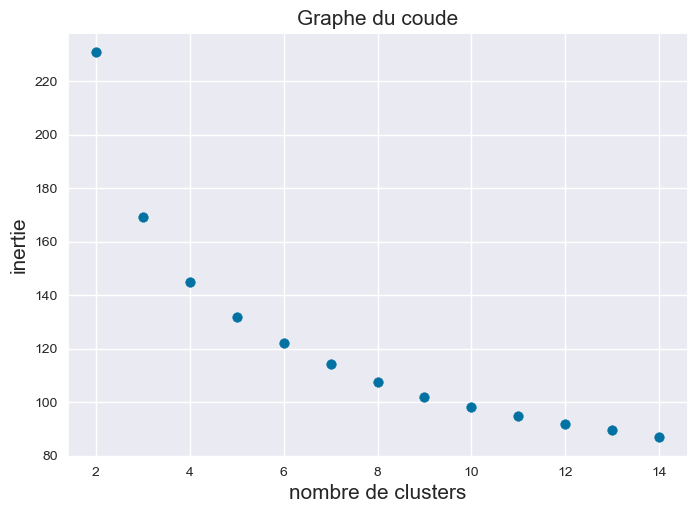

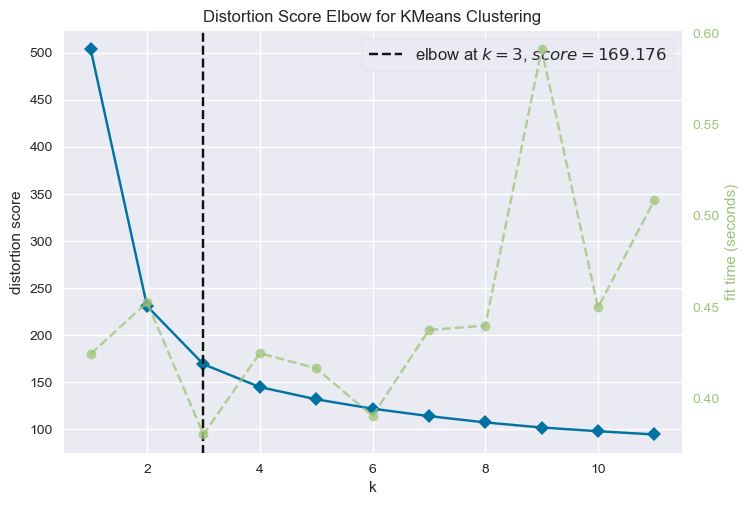

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [183]:
inertia = []
for k in range(1, 15):
    kmeans_jours = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    kmeans_jours.fit(data_jours)
    inertia.append(kmeans_jours.inertia_)
inertia = np.array(inertia)


plt.scatter(range(2, 15), inertia[1:])
plt.xlabel('nombre de clusters', fontsize = 15)
plt.ylabel('inertie', fontsize = 15)
plt.title("Graphe du coude", fontsize = 15)
plt.show()


# --- #


# Using yellowbrick

kmeans_jours = KMeans(init='random', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans_jours, k=(1,12))

visualizer.fit(data_jours)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

D'après les graphes précedents, on pourrait prendre 3 ou 4 clusters. Ce résultat est vérifié par les graphes du score silhouette ci-dessous. On choisira pour la suite de l'analyse 3 clusters. 

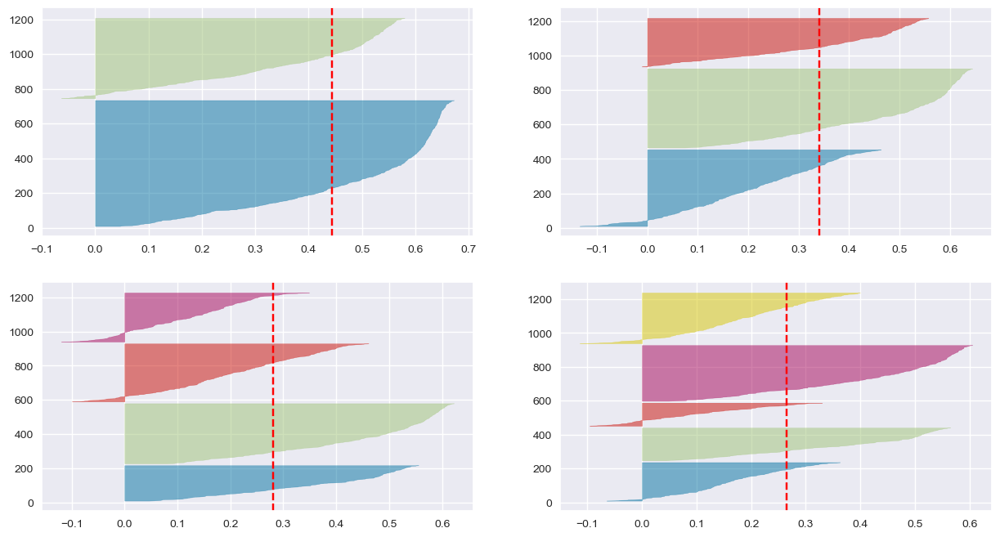

In [184]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))

for k in range(2, 6):
    kmeans_jours = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    q, mod = divmod(k, 2) 
    # Create SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(kmeans_jours, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(data_jours)

Observons mainteant la répartition des valeurs dans chaque clusters.

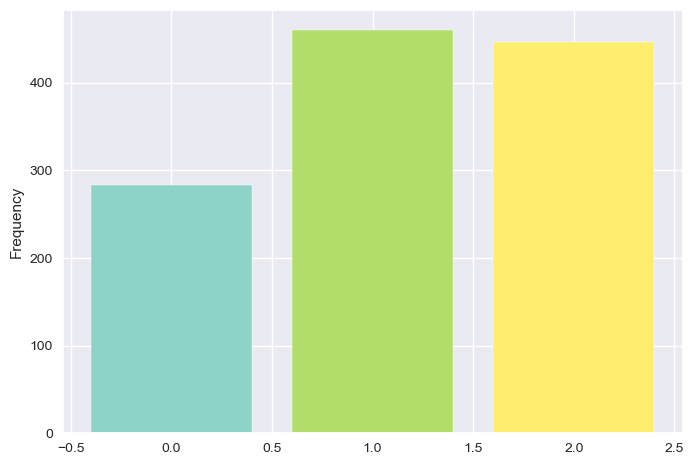

In [185]:
K = 3

kmeans_jours = KMeans(n_clusters=K, init='random', n_init='auto', random_state=0)
clusters_jours = kmeans_jours.fit_predict(data_jours)

# ----- #

cmap = plt.get_cmap('Set3',K)
plt.bar(*np.unique(clusters_jours, return_counts=True), color=cmap.colors)
plt.ylabel("Frequency")
plt.show()

col_0    0    1    2
bonus               
0      281  342  439
1        2  118    7


<Figure size 800x600 with 0 Axes>

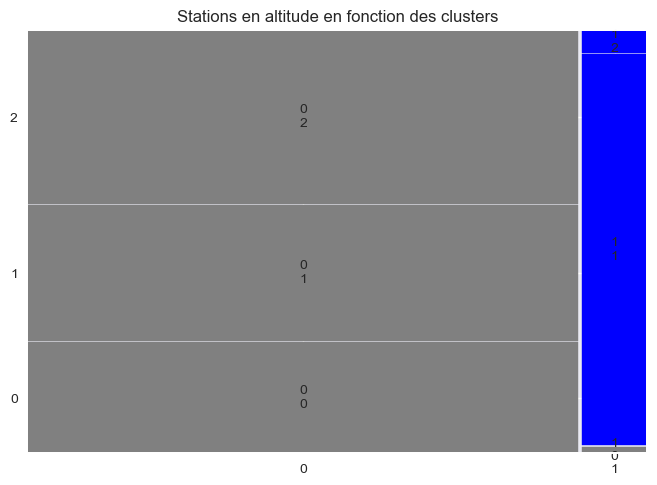

In [186]:
# Créer une table croisée des données bonus et des clusters

tbl3 = pd.crosstab( coord['bonus'], clusters_jours)
print(tbl3)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl3.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


Les stations en altitude sont, dans ce cas aussi regroupées dans un seul cluster (ici le 2ème)

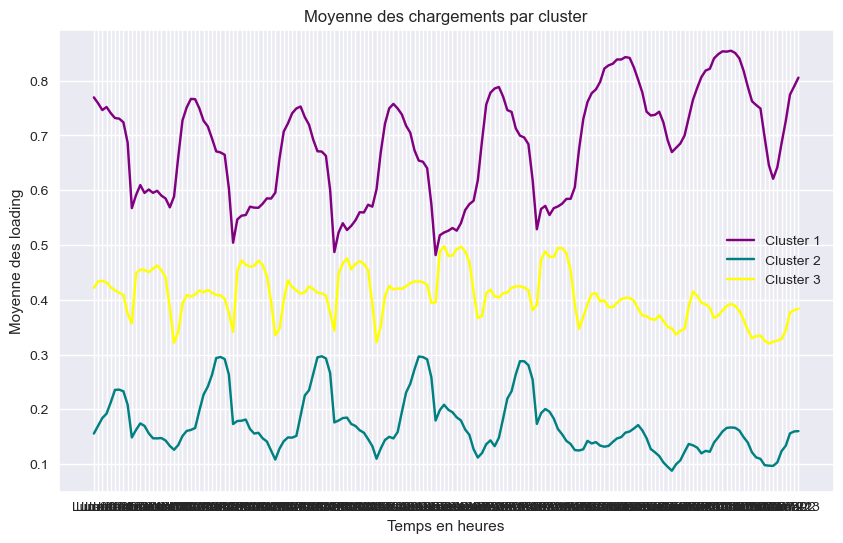

In [187]:
loading_sub3 = loading.iloc[:,:]
loading_sub3['cluster']=clusters_jours
mean_loading3=loading_sub3.groupby('cluster').mean()
mean_loading3.head()

fig, ax = plt.subplots(figsize=(10, 6))
col = ['#800080','#008080','#FFFF00']

# Affichage des 4 lignes sur le même graphique
for i in range(3):
    ax.plot(mean_loading3.columns, mean_loading3.iloc[i], label=f'Cluster {i+1}',color=col[i])

plt.legend()
plt.title('Moyenne des chargements par cluster')
plt.xlabel('Temps en heures')
plt.ylabel('Moyenne des loading')
plt.show()


Sur le data frame des données regoupées par jours, les interprétations des clusters sont différentes. On peut voir que les clusters se différencient surtout sur leur moyenne de chargement. \
Le cluster 2 correspond aux stations peu chargées en moyenne (il comprend la majorité des stations en altitude). \
Le cluster 3 correspond aux stations moyennement chargées.\
Enfin, le cluster 1 correspond lui, aux stations chargées.\
On voit peu de différence entre la semaine/weekend sur le profil de chargement comparé à data_heures (et data_heures_pca) où la moyenne de chargement des clusters étaient complétement différentes en fonction de l'heure. 
Cela confirme notre analyse descriptive : le week-end a peu d'influence sur le chargement des stations. Cela a également pu se voir par le peu d'information que porte la composante 2 dans l'acp sur data_jours (8,2%)

In [ ]:
# Etude sur data_jours_pca

In [ ]:
inertia = []
for k in range(1, 15):
    kmeans_PCA_jours = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    kmeans_PCA_jours.fit(data_jours_pca )
    inertia.append(kmeans_PCA_jours.inertia_)
inertia = np.array(inertia)


plt.scatter(range(2, 15), inertia[1:])
plt.xlabel('nombre de clusters', fontsize = 15)
plt.ylabel('inertie', fontsize = 15)
plt.title("Graphe du coude", fontsize = 15)
plt.show()


# --- #


# Using yellowbrick

kmeans_PCA_jours = KMeans(init='random', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans_PCA_jours, k=(2,12))

visualizer.fit(data_jours_pca )    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

D'après les graphes précedents on pourrait choisir un nombre de clusters de 4.  

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))

for k in range(2, 6):
    kmeans_PCA_jours = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    q, mod = divmod(k, 2) 
    # Create SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(kmeans_PCA_jours, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(data_jours_pca )

Ces score silhouettes montrent que 3 ou 4 clusters est un bon choix. Pour tenter de coller à l'analyse des données non réduites, on va choisir 3 clusters. 

In [193]:
K = 3

kmeans_PCA_jours = KMeans(n_clusters=K, init='random', n_init='auto', random_state=0)
clusters_jours_pca = kmeans_PCA_jours.fit_predict(data_jours_pca )

In [194]:
#reclassement des clusters pour matcher les couleurs
cm2, clusters_jours_pca_sorted = matchClasses(clusters_jours, clusters_jours_pca)


Classes size: [423 250 447]
Class (in the classif1 numbering): [2 0 1]



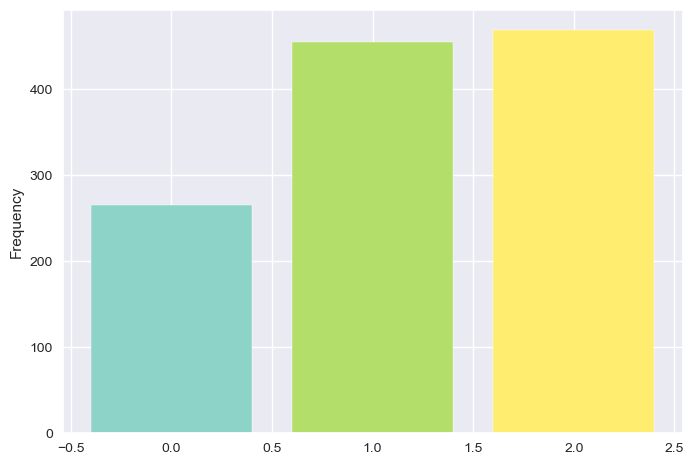

In [196]:
cmap = plt.get_cmap('Set3',K)
plt.bar(*np.unique(clusters_jours_pca_sorted, return_counts=True), color=cmap.colors)
plt.ylabel("Frequency")
plt.show()

La répartition des valeurs est la même que précedemment.

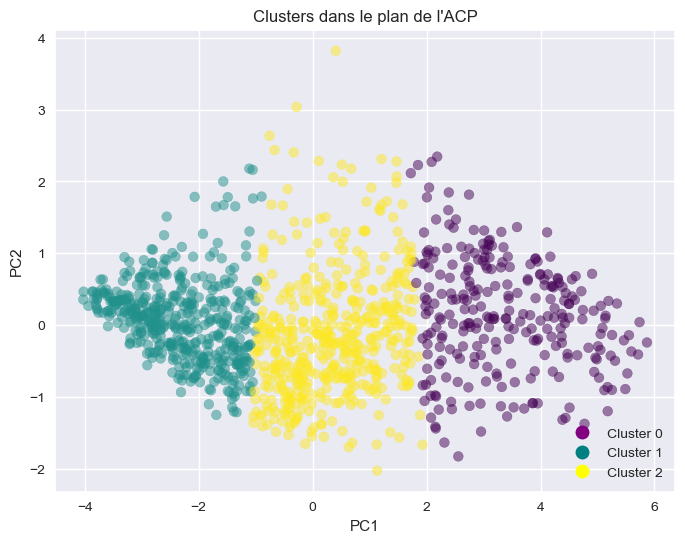

In [197]:
plt.figure(figsize=(8, 6))
plt.scatter(data_jours_pca[:, 0], data_jours_pca[:, 1], c=clusters_jours_pca_sorted, cmap='viridis', s=50, alpha=0.5)
legend_labels = ['Cluster 0', 'Cluster 1', 'Cluster 2']  # Liste des étiquettes de légende pour chaque cluster
legend_markers = [plt.Line2D([0], [0], linestyle='none', marker='o', color='#800080', markersize=10),
                  plt.Line2D([0], [0], linestyle='none', marker='o', color='#008080', markersize=10),
                  plt.Line2D([0], [0], linestyle='none', marker='o', color='#FFFF00', markersize=10)]
plt.legend(legend_markers, legend_labels, loc='lower right')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Clusters dans le plan de l\'ACP')
plt.show()
    


Les valeurs sont bien réparties entre les clusters et ne se mélangent pas.

col_0    0    1    2
bonus               
0      264  336  462
1        1  119    7


<Figure size 800x600 with 0 Axes>

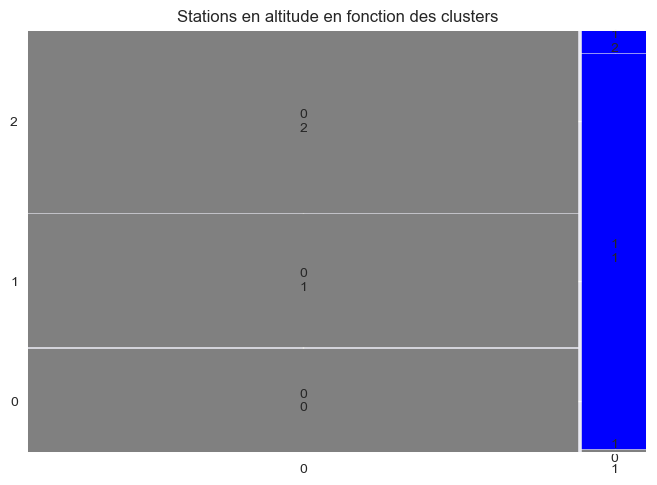

In [198]:
# Créer une table croisée des données bonus et des clusters

tbl4 = pd.crosstab( coord['bonus'], clusters_jours_pca_sorted)
print(tbl4)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl4.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


Le 2ème cluster contient les stations en altitude.

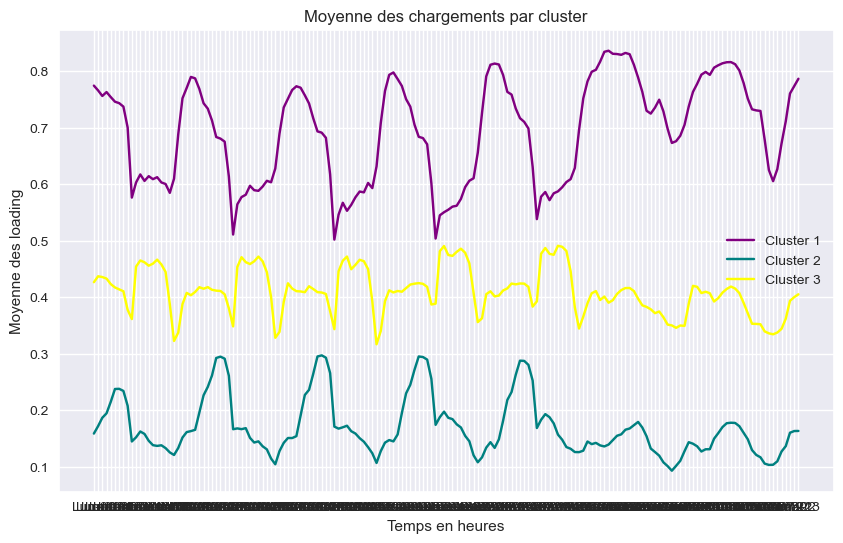

In [200]:
loading_sub4 = loading.iloc[:,:]
loading_sub4['cluster']=clusters_jours_pca_sorted
mean_loading4=loading_sub4.groupby('cluster').mean()
mean_loading4.head()

fig, ax = plt.subplots(figsize=(10, 6))
col = ['#800080','#008080','#FFFF00']

# Affichage des 4 lignes sur le même graphique
for i in range(3):
    ax.plot(mean_loading4.columns, mean_loading4.iloc[i], label=f'Cluster {i+1}', color= col[i])

plt.legend()
plt.title('Moyenne des chargements par cluster')
plt.xlabel('Temps en heures')
plt.ylabel('Moyenne des loading')
plt.show()


Comme précédemment, on remarque un cluster qui représente les stations non chargées, un autre les stations moyennement chargées et enfin celles qui le sont le plus.

Comparaison des deux classifications :

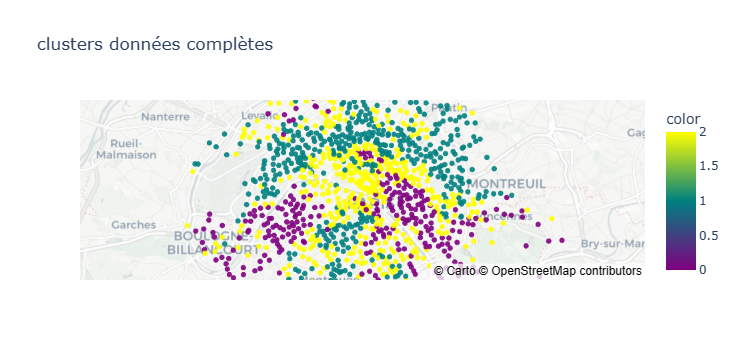

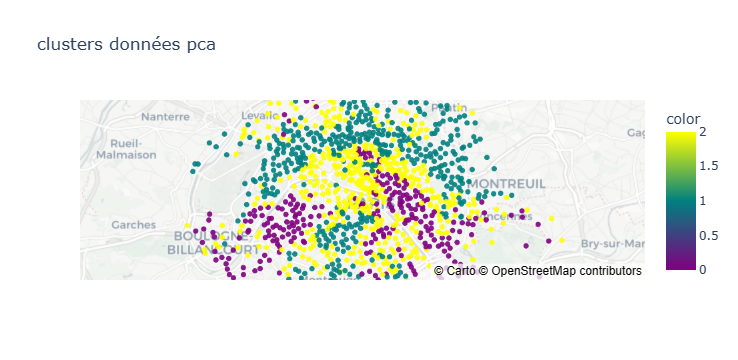

Nombre de points différents : 69 sur 1189
Pourcentage de réussite : 94.20%


In [203]:
Position = np.array(coord)[:,0:2]

#graphe à pour data_jours entier
f1 = px.scatter_mapbox(clusters_jours, Position[:,1], Position[:,0], color=clusters_jours, color_continuous_scale=[(0, '#800080'), (0.5, '#008080'), (1, '#FFFF00')], 
                        size_max=15, zoom=10,mapbox_style="carto-positron", opacity = .9,
                        title = 'clusters données complètes')

f1.show()

#graphe à pour data_jours_pca
f2 = px.scatter_mapbox(clusters_jours_pca_sorted, Position[:,1], Position[:,0], color=clusters_jours_pca_sorted, color_continuous_scale =[(0, '#800080'), (0.5, '#008080'), (1, '#FFFF00')], 
                        size_max=15, zoom=10,mapbox_style="carto-positron", opacity = .9,
                        title = 'clusters données pca')
f2.show()



points_diff = clusters_jours != clusters_jours_pca_sorted

# Calcul du nombre de points différents
num_diff_points = np.sum(points_diff)

# Calcul du pourcentage de réussite
pourcentage_reussite = (1- num_diff_points / len(clusters_jours)) * 100

# Affichage du résultat
print(f"Nombre de points différents : {num_diff_points} sur {len(clusters_jours)}")
print(f"Pourcentage de réussite : {pourcentage_reussite:.2f}%")




Le pourcentage de réussite d'association des points est moins importante que pour l'étude précédente cependant il reste toujours assez important pour pouvoir considérer que les données réduites avec l'ACP réprésentent bien les données complètes.

In [ ]:
ConfusionMatrixDisplay(confusion_matrix(clusters_jours, clusters_jours_pca)).plot()
plt.xlabel('On the reduced data (PCA)')
plt.ylabel('On the complete data')
plt.show()

On visualise bien grâce à ce graphe que la majorité des valeurs sont bien réparties dans les 3 clusters différents mais sont mélangées, il faut les reclasser.

In [ ]:
# reclassement des clusters

In [ ]:
ConfusionMatrixDisplay(cm2).plot()
plt.xlabel('On the reduced data (PCA)')
plt.ylabel('On the complete data')
plt.show()

Cette figure valide ce qui a été dit précedemment, soit que les données dans le plan réduit et dans le plan PCA correspondent bien.

In [ ]:
#on convertit la table de confusion en dataframe 
df_cm2 = pd.DataFrame(cm2, columns=['groupe0', 'groupe1','groupe2'], index=['groupe_pca0', 'groupe_pca1','groupe_pca2',])
df_cm2.head()

#### 4.1.2. CAH : Agglomerative Clustering


Etudions ici la méthode de la classification ascendante hiérarchique (CAH). Cette méthode consiste à afficher des dendrogrammes des différente données en fonction de différents likages.

Comme expliqué précedemment, on préférera faire l'analyse en prenant un échantillon plus petit pour minimiser les temps de calculs. Nous avons vu que l'analyse des données PCA donnait de bons résultats, donc pour faciliter les calculs, lors des analyses suivantes nous prendrons les données réduites

In [ ]:
print("taille data_jours : " +str(data_jours.shape))
print("taille data_jours_pca : " +str(data_jours_pca.shape))

Les données pca sont donc bien réduites.

On détermine le nombre de clusters adéquats grâce aux graphes du coude

In [ ]:
ac = AgglomerativeClustering(linkage="ward", compute_distances=True)
clusters_cah2 = ac.fit_predict(data_jours_pca)

distances = ac.distances_

n_sizes = 15
x = np.arange(n_sizes, 0, -1)
y = ac.distances_[-n_sizes:]

plt.scatter(x, y)

plt.xlabel('Point indices')
plt.ylabel('Distances')
plt.title("Choice of the number of classes")
plt.show()

### avec yellowbrick ###
ac = AgglomerativeClustering(linkage='ward', compute_distances=True)
visualizer = KElbowVisualizer(ac, k=(2,12))

visualizer.fit(data_jours_pca)  # Fit the data to the visualizer
visualizer.show()   
plt.show()

D'après les résultats précedents, il faut prendre 4 clusters différents.  On affiche alors le dendrogramme associé en utilisant les linkages "Ward".

In [ ]:
#Nombre de clusters choisi par les indicateurs 
K = 4

ac = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage='ward')
clusterscah2 = ac.fit(data_jours_pca)

children = ac.children_
distances = ac.distances_
n_observations = np.arange(2, children.shape[0]+2)
linkage_matrix = np.c_[children, distances, n_observations]

sch.dendrogram(linkage_matrix, labels=ac.labels_)

# Cutting the dendrogram to get K classes
max_d = .5*(ac.distances_[-K]+ac.distances_[-K+1])
plt.axhline(y=max_d, c='k')

plt.title("Dendrogram with Ward linkage")
plt.show()

On affiche tous les types de linkages que l'on a étudié pour montrer que "Ward" et "complete" sont les deux types dont les graphes sont faciles à explorer:

In [ ]:
plt.subplot(2,2,1)
linkage_matrix_single = sch.linkage(data_jours_pca, method='single')
sch.dendrogram(linkage_matrix_single)
plt.title("Dendrogram with single linkage")

plt.subplot(2,2,2)
linkage_matrix_complete = sch.linkage(data_jours_pca, method='complete')
sch.dendrogram(linkage_matrix_complete)
plt.title("Dendrogram with complete linkage")

plt.subplot(2,2,3)
linkage_matrix_average = sch.linkage(data_jours_pca, method='average')
sch.dendrogram(linkage_matrix_average)
plt.title("Dendrogram with average linkage")

plt.subplot(2,2,4)
linkage_matrix_ward = sch.linkage(data_jours_pca, method='ward')
sch.dendrogram(linkage_matrix_ward)
plt.title("Dendrogram with Ward linkage")

plt.tight_layout()
plt.show()

In [ ]:
tbl_c2 = pd.crosstab( coord['bonus'], clusterscah2)

# Afficher la table croisée
print(tbl_c2)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl_c2.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


#### 4.1.3. Gaussian Mixture Models

On peut utiliser les données issues de l'ACP car elle résume bien 

In [ ]:
K = 4
cmap = plt.get_cmap('Set3', K)

gmm = GaussianMixture(n_components=K, n_init=3)
clusters_gmm_heures = gmm.fit_predict(loading)

# --- #

plt.subplot(1,2,1)
plt.scatter(data_jours_pca[:,0], data_jours_pca[:,1], c=clusters_gmm_heures, s=1, linewidths=1, cmap='viridis')
plt.grid(True)


plt.tight_layout()
plt.show()

In [ ]:
# Critère BIC :

In [ ]:
k_max = 15

bic = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=3)
    gmm.fit(data_jours_pca)
    bic.append(gmm.bic(data_jours_pca))
bic = np.array(bic)

plt.scatter(range(2, k_max), bic)
plt.show()

En appliquant le critère BIC on devrait garder 5 variables pour expliquer nos données.

Réalisons maintenant une étude comparative des différentes méthodes de clusters : 

In [ ]:
cm2_GMM, clusters_pca_sorted_heures_GMM = matchClasses(clusters_gmm_heures, clusters_jours_pca)


ConfusionMatrixDisplay(cm2_GMM).plot()

plt.xlabel('Kmeans sur les données jours réduites (PCA)')
plt.ylabel('Gmm sur les données jours réduites ')
plt.show()

df_kmeans_gmm2 = pd.DataFrame(cm2_GMM, columns=['groupe0', 'groupe1','groupe2','groupe3'], index=['groupe_pca0', 'groupe_pca1','groupe_pca2', 'groupe_pca3'])
df_kmeans_gmm2.head()

### 4.2. CA : comparaison méthodes de clustering

## 5. Etude sur le jeu de données par heures

### 5.1. ACP

In [160]:
# Calcul des moyennes pour chaque heure de la journée
minuit_am = loading.iloc[:, [0, 24, 48, 72, 96, 120, 144]].mean(axis=1)
une_am = loading.iloc[:, [1, 25, 49, 73, 97, 121, 145]].mean(axis=1)
deux_am = loading.iloc[:, [2, 26, 50, 74, 98, 122, 146]].mean(axis=1)
trois_am = loading.iloc[:, [3, 27, 51, 75, 99, 123, 147]].mean(axis=1)
quatre_am = loading.iloc[:, [4, 28, 52, 76, 100, 124, 148]].mean(axis=1)
cinq_am = loading.iloc[:, [5, 29, 53, 77, 101, 125, 149]].mean(axis=1)
six_am = loading.iloc[:, [6, 30, 54, 78, 102, 126, 150]].mean(axis=1)
sept_am = loading.iloc[:, [7, 31, 55, 79, 103, 127, 151]].mean(axis=1)
huit_am = loading.iloc[:, [8, 32, 56, 80, 104, 128, 152]].mean(axis=1)
neuf_am = loading.iloc[:, [9, 33, 57, 81, 105, 129, 153]].mean(axis=1)
dix_am = loading.iloc[:, [10, 34, 58, 82, 106, 130, 154]].mean(axis=1)
onze_am = loading.iloc[:, [11, 35, 59, 83, 107, 131, 155]].mean(axis=1)
minuit_pm = loading.iloc[:, [12, 36, 60, 84, 108, 132, 156]].mean(axis=1)
une_pm = loading.iloc[:, [13, 37, 61, 85, 109, 133, 157]].mean(axis=1)
deux_pm = loading.iloc[:, [14, 38, 62, 86, 110, 134, 158]].mean(axis=1)
trois_pm = loading.iloc[:, [15, 39, 63, 87, 111, 135, 159]].mean(axis=1)
quatre_pm = loading.iloc[:, [16, 40, 64, 88, 112, 136, 160]].mean(axis=1)
cinq_pm = loading.iloc[:, [17, 41, 65, 89, 113, 137, 161]].mean(axis=1)
six_pm = loading.iloc[:, [18, 42, 66, 90, 114, 138, 162]].mean(axis=1)
sept_pm = loading.iloc[:, [19, 43, 67, 91, 115, 139, 163]].mean(axis=1)
huit_pm = loading.iloc[:, [20, 44, 68, 92, 116, 140, 164]].mean(axis=1)
neuf_pm = loading.iloc[:, [21, 45, 69, 93, 117, 141, 165]].mean(axis=1)
dix_pm = loading.iloc[:, [22, 46, 70, 94, 118, 142, 166]].mean(axis=1)
onze_pm = loading.iloc[:, [23, 47, 71, 95, 119, 143, 167]].mean(axis=1)

# Création du nouveau DataFrame
data_heures = pd.DataFrame({
    'Minuit': minuit_am,
    '1h': une_am,
    '2h': deux_am,
    '3h': trois_am,
    '4h': quatre_am,
    '5h': cinq_am,
    '6h': six_am,
    '7h': sept_am,
    '8h': huit_am,
    '9h': neuf_am,
    '10h': dix_am,
    '11h': onze_am,
    '12h': minuit_pm,
    '13h': une_pm,
    '14h': deux_pm,
    '15h': trois_pm,
    '16h': quatre_pm,
    '17h': cinq_pm,
    '18h': six_pm,
    '19h': sept_pm,
    '20h': huit_pm,
    '21h': neuf_pm,
    '22h': dix_pm,
    '23h': onze_pm
})

print(data_heures)

        Minuit        1h        2h        3h        4h        5h        6h  \
1     0.317475  0.331647  0.363975  0.383990  0.395139  0.400052  0.410634   
2     0.838509  0.826087  0.807453  0.819876  0.826087  0.826087  0.826087   
3     0.475774  0.413485  0.391440  0.388795  0.375663  0.354884  0.352287   
4     0.231293  0.238095  0.231293  0.251701  0.251701  0.251701  0.251701   
5     0.557892  0.508146  0.461705  0.419069  0.376858  0.347513  0.313966   
...        ...       ...       ...       ...       ...       ...       ...   
1185  0.149068  0.248447  0.291925  0.285714  0.298137  0.298419  0.310559   
1186  0.266667  0.301587  0.336508  0.352381  0.371429  0.387302  0.387302   
1187  0.337931  0.376355  0.434483  0.444171  0.458621  0.473235  0.459113   
1188  0.435918  0.439456  0.439456  0.489524  0.506667  0.493061  0.507755   
1189  0.369487  0.393371  0.384299  0.335192  0.321799  0.293594  0.306987   

            7h        8h        9h  ...       14h       15h    

In [163]:
# Standardisation des données
données_heures_stand = scaler.fit_transform(data_heures)
print(données_heures_stand)

[[-0.26059368 -0.24443098 -0.15343027 ...  0.42700054  0.61987643
   0.3967952 ]
 [ 1.48946481  1.42191642  1.36209942 ...  1.25771273  1.346584
   1.3905872 ]
 [ 0.27110493  0.03137571 -0.05957013 ...  0.66251348  0.61110604
   0.54912397]
 ...
 [-0.19188515 -0.09375902  0.08752181 ... -0.60558799 -0.63373274
  -0.44806465]
 [ 0.1372362   0.1189026   0.10451646 ...  0.44315134  0.38768311
   0.30310465]
 [-0.08589616 -0.03640952 -0.08397492 ...  0.07271845 -0.0113928
  -0.13886283]]


In [164]:
pca_3 = PCA()
data_heures_pca = pca_3.fit_transform(données_heures_stand)

on garde 2 composants pour le PCA


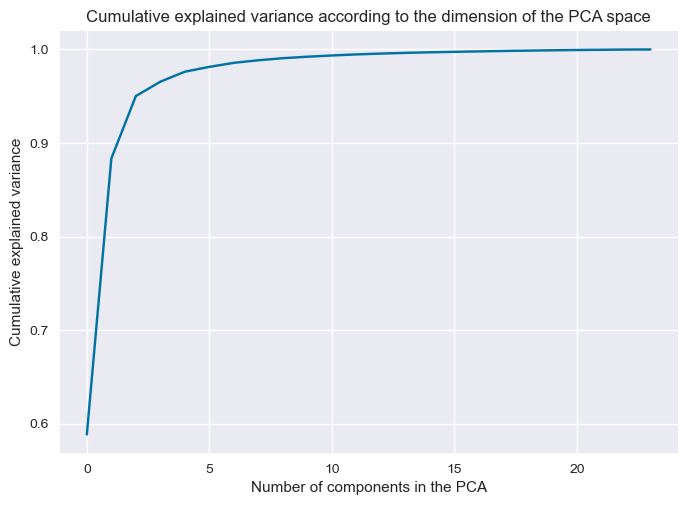

In [165]:
plt.plot(np.cumsum(pca_3.explained_variance_ratio_))

plt.title('Cumulative explained variance according to the dimension of the PCA space')
plt.xlabel('Number of components in the PCA')
plt.ylabel('Cumulative explained variance');


#permet de connaître le nombre de variables à garder pour expliquer 90% de la variance 

#pca = PCA(0.90).fit(loading) 

pca_3 = PCA(0.85).fit(données_heures_stand) #pour savoir directement le nombre de composants nécessaire pour représenter une explication de 85% de la variance
pca_3.n_components_ #on affiche le nb de composants qu'on garde pour la PCA
print(f"on garde {pca_3.n_components_} composants pour le PCA")


In [166]:
pca_3 = PCA(n_components = 2)
data_heures_pca = pca_3.fit_transform(données_heures_stand) #même chose que fit puis transform dans notre cas à nous

print(100*pca_3.explained_variance_ratio_)


print('--- PCA ---')
print('Initial dimension:', données_heures_stand.shape)
print('Dimension after projection:', data_heures_pca.shape)

print('')

print('--- Explained variance ---')
print('Component 1:', round(pca_3.explained_variance_[0],2), 'i.e.', round(100*pca_3.explained_variance_ratio_[0],2), '% of the total variance')
print('Component 2:', round(pca_3.explained_variance_[1],2), 'i.e.', round(100*pca_3.explained_variance_ratio_[1],2), '% of the total variance')


[58.85288786 29.49142488]
--- PCA ---
Initial dimension: (1189, 24)
Dimension after projection: (1189, 2)

--- Explained variance ---
Component 1: 14.14 i.e. 58.85 % of the total variance
Component 2: 7.08 i.e. 29.49 % of the total variance


In [ ]:
plt.figure(figsize=(10, 5))
sns.barplot(x=[f"PC{i+1}" for i in range(len(pca_3.explained_variance_ratio_))], y=pca_3.explained_variance_ratio_ * 100)
plt.xlabel("Composantes Principales")
plt.ylabel("Pourcentage de Variance Expliquée")
plt.title("Proportion de Variance Expliquée par Chaque Composante Principale")
plt.ylim(0,80)  # limiter l'axe y à la plage spécifiée
plt.show()


In [ ]:
box = plt.boxplot(data_heures_pca[:,:10], patch_artist=True)
plt.setp(box["boxes"], facecolor="coral", alpha=.5)
plt.title("Box plots of the first ten principal components")
plt.tight_layout()
plt.show()

In [ ]:
coord1 = pca.components_[0] * np.sqrt(pca_3.explained_variance_[0])
coord2 = pca.components_[1] * np.sqrt(pca_3.explained_variance_[1])

fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot(1, 1, 1)
for i, j, nom in zip(coord1, coord2, data_heures.columns):
    plt.text(i, j, nom, fontsize=10)
    plt.arrow(0, 0, i, j, color = 'purple', alpha=0.7, width = 0.0001)

plt.axis((-1, 1, -1, 1))
plt.gcf().gca().add_artist(plt.Circle((0, 0), radius = 1, color = 'cornflowerblue', fill = False))

plt.title('Variables factor map - PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

plt.grid(True)
plt.show()

#### 5.1.1. Méthode de clustering avec k-means


In [ ]:
inertia = []
for k in range(1, 15):
    kmeans_heures = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    kmeans_heures.fit(data_heures )
    inertia.append(kmeans_heures.inertia_)
inertia = np.array(inertia)


plt.scatter(range(2, 15), inertia[1:])
plt.xlabel('nombre de clusters', fontsize = 15)
plt.ylabel('inertie', fontsize = 15)
plt.title("Graphe du coude", fontsize = 15)
plt.show()


# --- #


# Using yellowbrick

kmeans_heures = KMeans(init='random', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans_heures, k=(1,12))

visualizer.fit(data_heures )    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

Comme pour l'analyse des autres jeux de données, le nombre de clusters idéal est 4. Avec les graphes de scores silhouettes qui suivent on peut valider ce résultat. 

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))

for k in range(2, 6):
    kmeans_heures = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    q, mod = divmod(k, 2) 
    # Create SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(kmeans_heures, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(data_heures )

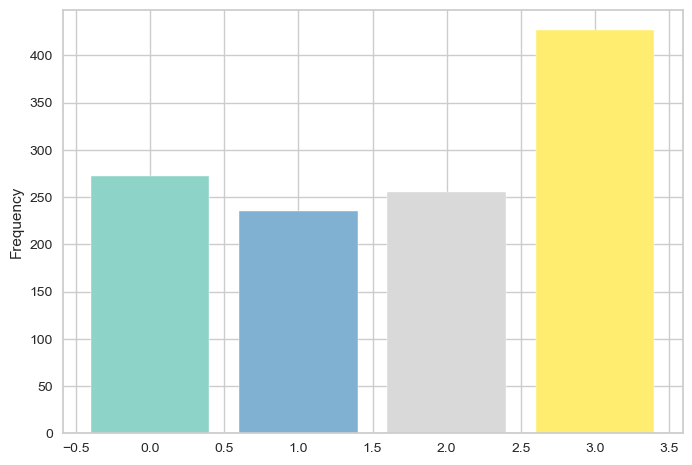

In [146]:
K = 4

kmeans_heures = KMeans(n_clusters=K, init='random', n_init='auto', random_state=0)
clusters_heures = kmeans_heures.fit_predict(data_heures)

# ----- #

cmap = plt.get_cmap('Set3',K)
plt.bar(*np.unique(clusters_heures, return_counts=True), color=cmap.colors)
plt.ylabel("Frequency")
plt.show()

Les valeurs sont réparties équitablement dans les 3 premiers clusters à la différence du dernier qui possède davantage de valeurs. 

col_0    0    1    2    3
bonus                    
0      271  234  245  312
1        1    1   10  115


<Figure size 800x600 with 0 Axes>

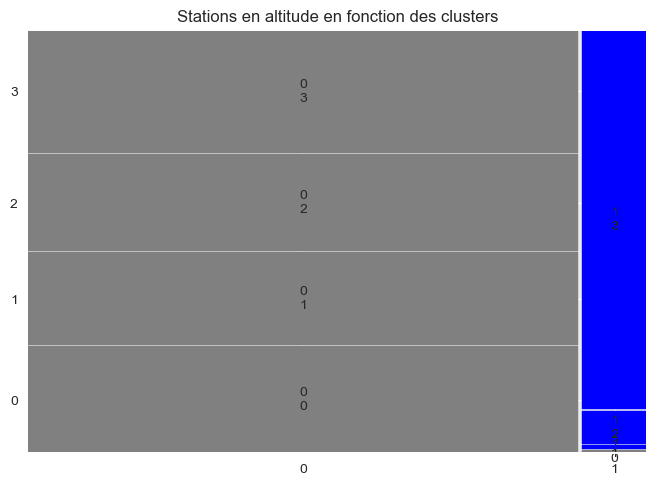

In [204]:
# Créer une table croisée des données bonus et des clusters

tbl5 = pd.crosstab( coord['bonus'], clusters_heures)
print(tbl5)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl5.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


A nouveau, on voit que les stations en altitudes sont toutes regroupées dans 1 seul cluster.

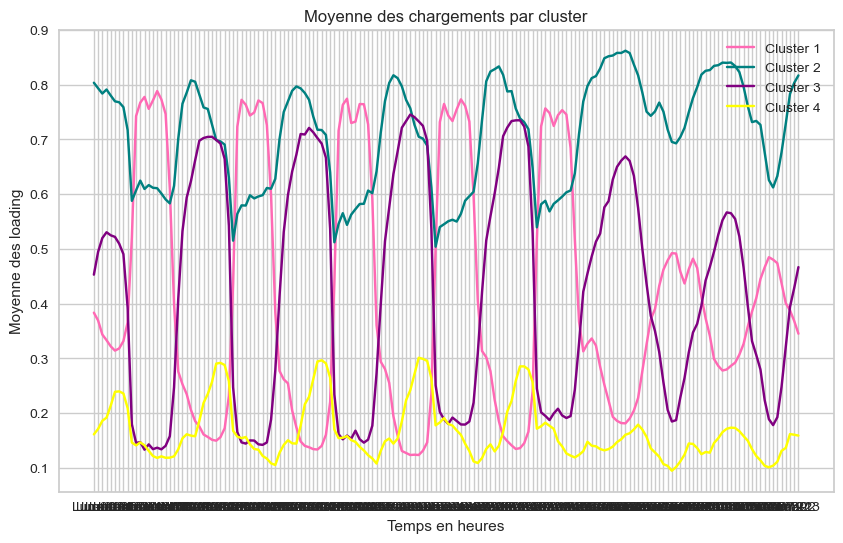

In [147]:
loading_sub5 = loading.iloc[:,:]
loading_sub5['cluster']=clusters_heures
mean_loading5=loading_sub5.groupby('cluster').mean()
mean_loading5.head()


fig, ax = plt.subplots(figsize=(10, 6))
col= ['#FF69B4', '#008080'  ,'#800080','#FFFF00']

# Affichage des 4 lignes sur le même graphique

for i in range(4):
    ax.plot(mean_loading5.columns, mean_loading5.iloc[i], label=f'Cluster {i+1}',color=col[i])

    
plt.legend()
plt.title('Moyenne des chargements par cluster')
plt.xlabel('Temps en heures')
plt.ylabel('Moyenne des loading')
plt.show()

Les tendances de courbes du chargement moyen de data_heures sont similaires à celles obtenues lors de l'étude de loading.
On retrouve un cluster qui à tendance à se vider le matin et à se remplir à nouveau le soir. Le second cluster correspond aux stations qui se chargent aussi le matin et se remplissent le soir mais qui auront tendances à rester assez remplies. 
Ensuite, on retrouve un cluster qui se charge la journée et se décharge la nuit. Le 4ème à un comportement similaire mais est plus souvent vide.

In [ ]:
# Etude sur data_heures_pca

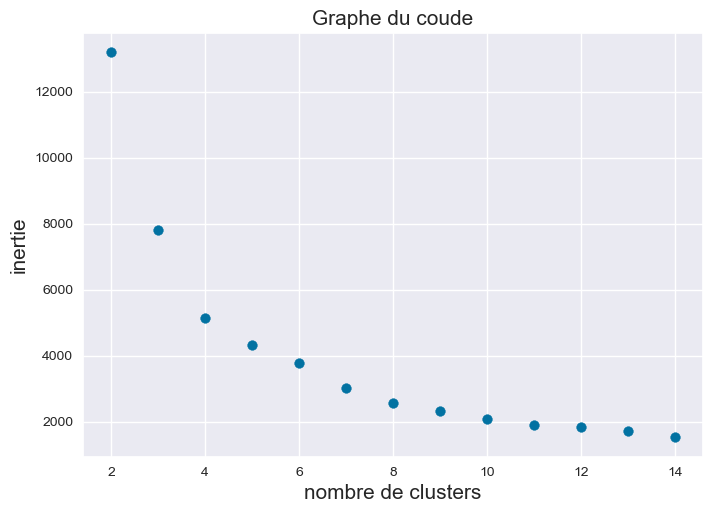

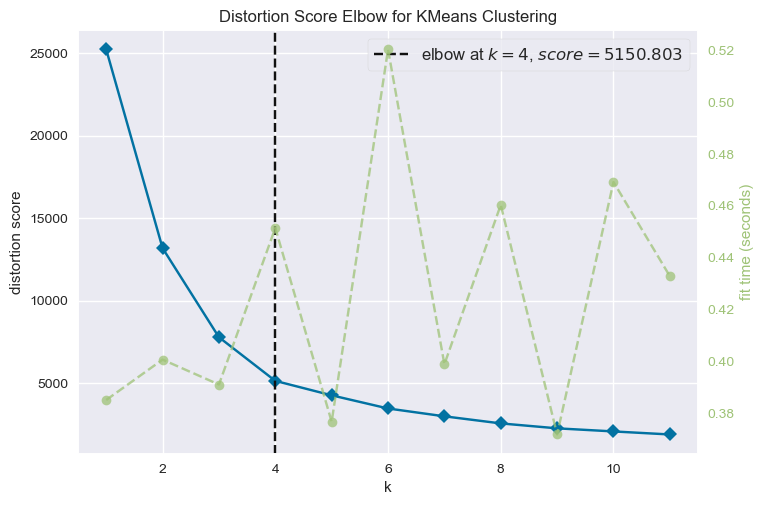

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [205]:
inertia = []
for k in range(1, 15):
    kmeans_PCA_heures = KMeans(n_clusters=k, init='k-means++', n_init='auto', max_iter=100, random_state=42)
    kmeans_PCA_heures.fit(data_heures_pca )
    inertia.append(kmeans_PCA_heures.inertia_)
inertia = np.array(inertia)


plt.scatter(range(2, 15), inertia[1:])
plt.xlabel('nombre de clusters', fontsize = 15)
plt.ylabel('inertie', fontsize = 15)
plt.title("Graphe du coude", fontsize = 15)
plt.show()


# --- #


# Using yellowbrick

kmeans_PCA_heures = KMeans(init='random', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans_PCA_heures, k=(1,12))

visualizer.fit(data_heures_pca)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

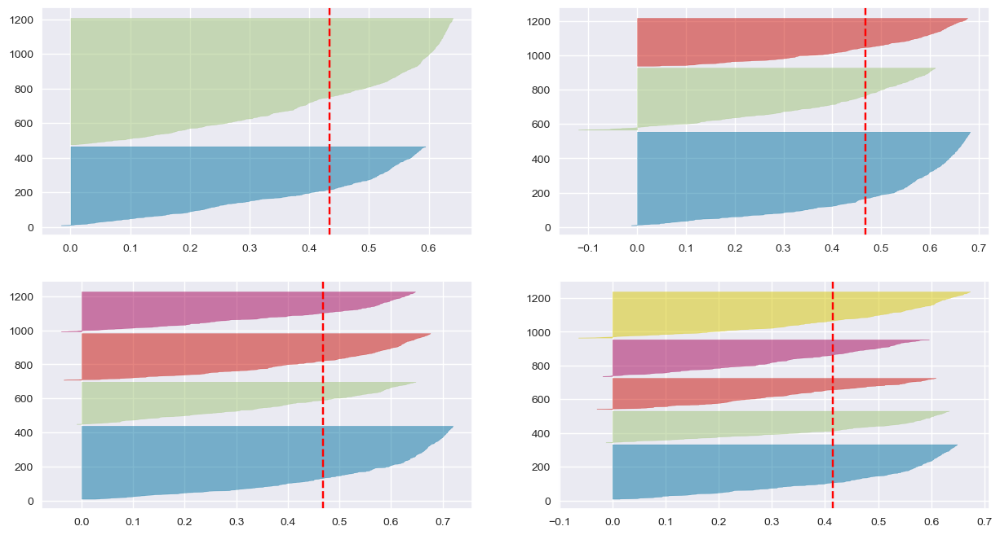

In [206]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))

for k in range(2, 6):
    kmeans_PCA_heures = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    q, mod = divmod(k, 2) 
    # Create SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(kmeans_PCA_heures, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(data_heures_pca )

Ici également, les résultats précedents nous montrent que le nombre de cluster le plus adapté est 4. 

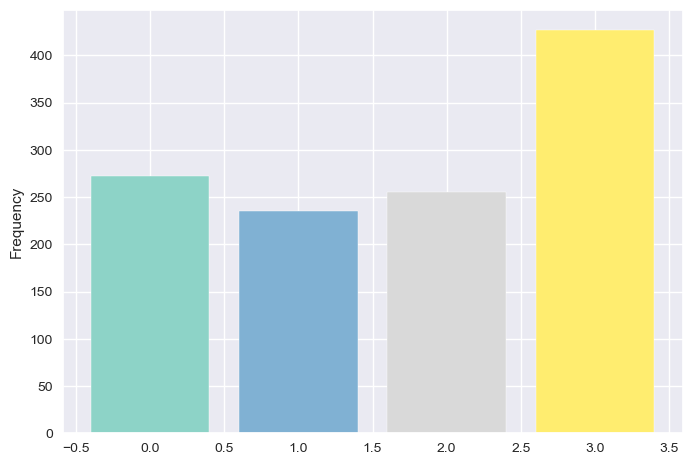

In [207]:
K = 4

kmeans_PCA_heures = KMeans(n_clusters=K, init='random', n_init='auto', random_state=0)
clusters_heures_pca = kmeans_PCA_heures.fit_predict(data_heures_pca )

# ----- #

cmap = plt.get_cmap('Set3',K)
plt.bar(*np.unique(clusters_heures, return_counts=True), color=cmap.colors)
plt.ylabel("Frequency")
plt.show()

In [ ]:
Les données sont regroupées de la même facon que pour les données data_heures complètes.

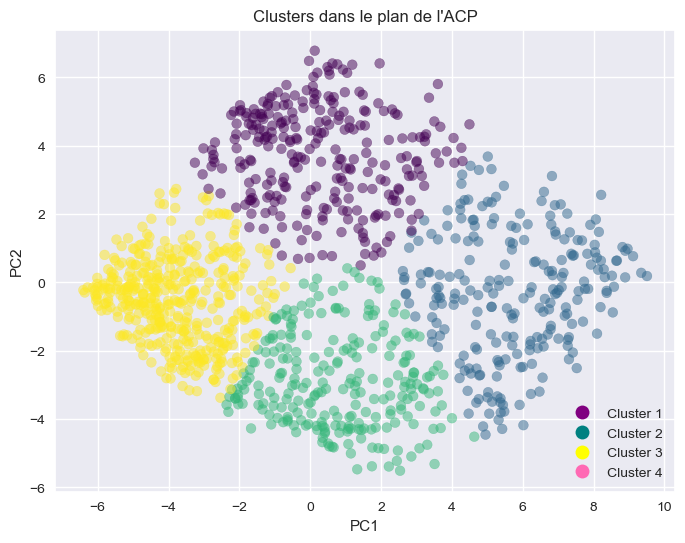

In [208]:
plt.figure(figsize=(8, 6))
plt.scatter(data_heures_pca[:, 0], data_heures_pca[:, 1], c=clusters_heures_pca, cmap='viridis', s=50, alpha=0.5)
legend_labels = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']  # Liste des étiquettes de légende pour chaque cluster
legend_markers = [plt.Line2D([0], [0], linestyle='none', marker='o', color='#800080', markersize=10),
                  plt.Line2D([0], [0], linestyle='none', marker='o', color='#008080', markersize=10),
                  plt.Line2D([0], [0], linestyle='none', marker='o', color='#FFFF00', markersize=10),
                  plt.Line2D([0], [0], linestyle='none', marker='o', color='#FF69B4', markersize=10)]

plt.legend(legend_markers, legend_labels, loc='lower right')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Clusters dans le plan de l\'ACP')
plt.show()



Ce graphe représente la répartition des données dans le plan de l'ACP (dim 1 et dim 2). On voit que les points sont bien réparties dans les clusters et qu'ils ne se mélangent pas.\
Les points violets correspondent aux stations en centre ville.
Les points bleus et verts correspondent aux stations très chargées la nuit.
Et les points jaunes correspondent aux stations vides en général.

col_0    0    1    2    3
bonus                    
0      273  234  239  316
1        2    1   10  114


<Figure size 800x600 with 0 Axes>

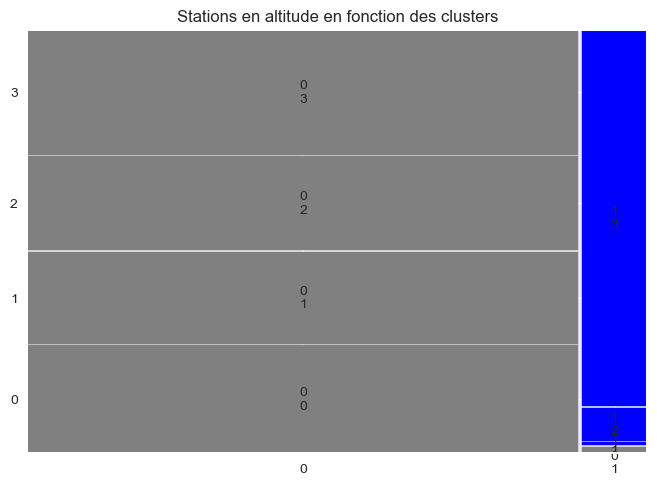

In [209]:
# Créer une table croisée des données bonus et des clusters

tbl6 = pd.crosstab( coord['bonus'], clusters_heures_pca)
print(tbl6)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl6.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


De même, les stations en altitudes sont regroupées dans un unique cluster

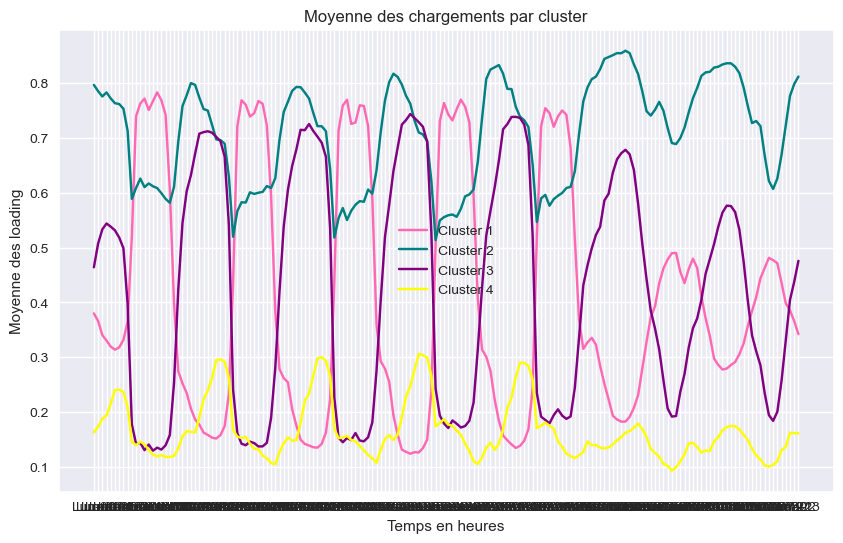

In [210]:
loading_sub6 = loading.iloc[:,:]
loading_sub6['cluster']=clusters_heures_pca
mean_loading6=loading_sub6.groupby('cluster').mean()
mean_loading6.head()

fig, ax = plt.subplots(figsize=(10, 6))
col =  ['#FF69B4', '#008080'  ,'#800080','#FFFF00']

# Affichage des 4 lignes sur le même graphique
for i in range(4):
    ax.plot(mean_loading6.columns, mean_loading6.iloc[i], label=f'Cluster {i+1}',color=col[i])

    
plt.legend()
plt.title('Moyenne des chargements par cluster')
plt.xlabel('Temps en heures')
plt.ylabel('Moyenne des loading')
plt.show()

In [ ]:
## les stations bleues sont chargées que la journée et elles sont totalement vides la nuit 

In [216]:
 cm3,res_pca_sorted = matchClasses(clusters_heures, clusters_heures_pca)


Classes size: [272 232 246 425]
Class (in the classif1 numbering): [0 1 2 3]



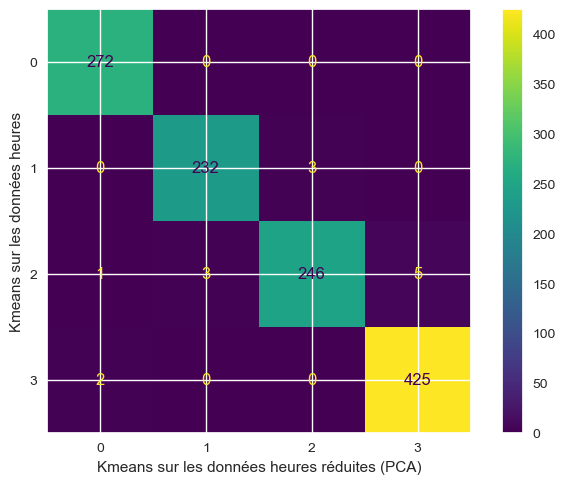

In [218]:
ConfusionMatrixDisplay(cm3).plot()
plt.xlabel('Kmeans sur les données heures réduites (PCA)')
plt.ylabel('Kmeans sur les données heures')
plt.show()


In [221]:
#on convertit la table de confusion en dataframe 
df_cm3 = pd.DataFrame(cm3, columns=['groupe0','groupe1', 'groupe2','groupe3'], index=['groupe_pca0', 'groupe_pca1', 'groupe_pca2', 'groupe pca3'])
df_cm3.head()

,groupe0,groupe1,groupe2,groupe3
groupe_pca0,272,0,0,0
groupe_pca1,0,232,3,0
groupe_pca2,1,3,246,5
groupe pca3,2,0,0,425


#### 5.1.2. CAH : Agglomerative Clustering

Etudions ici la méthode de la classification ascendante hiérarchique (CAH). Cette méthode consiste à afficher des dendrogrammes des différente données en fonction de différents likages.

Comme expliqué précedemment, on préférera faire l'analyse en prenant un échantillon plus petit pour minimiser les temps de calculs. Nous avons vu que l'analyse des données PCA donnait de bons résultats, donc pour faciliter les calculs, lors des analyses suivantes nous prendrons les données réduites

In [ ]:
print("taille data_heures : " +str(data_heures.shape))
print("taille data_heures_pca : " +str(data_heures_pca.shape))

Les données pca sont bien réduites.

On détermine le nombre de clusters adéquats grâce aux graphes du coude

In [ ]:
ac = AgglomerativeClustering(linkage="ward", compute_distances=True)
clusters_cah3 = ac.fit_predict(data_heures_pca)

distances = ac.distances_

n_sizes = 15
x = np.arange(n_sizes, 0, -1)
y = ac.distances_[-n_sizes:]

plt.scatter(x, y)

plt.xlabel('Point indices')
plt.ylabel('Distances')
plt.title("Choice of the number of classes")
plt.show()

### avec yellowbrick ###
ac = AgglomerativeClustering(linkage='ward', compute_distances=True)
visualizer = KElbowVisualizer(ac, k=(1,12))

visualizer.fit(data_heures_pca)  # Fit the data to the visualizer
visualizer.show()   
plt.show()

D'après les résultats précedents, il faut prendre 4 clusters différents.  On affiche alors le dendrogramme associé en utilisant les linkages "Ward".

In [ ]:
#Nombre de clusters choisi par les indicateurs 
K = 3

ac = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage='ward')
clusterscah3 = ac.fit(data_heures_pca)

children = ac.children_
distances = ac.distances_
n_observations = np.arange(2, children.shape[0]+2)
linkage_matrix = np.c_[children, distances, n_observations]

sch.dendrogram(linkage_matrix, labels=ac.labels_)

# Cutting the dendrogram to get K classes
max_d = .5*(ac.distances_[-K]+ac.distances_[-K+1])
plt.axhline(y=max_d, c='k')

plt.title("Dendrogram with Ward linkage")
plt.show()

On affiche tous les types de linkages que l'on a étudié pour montrer que "Ward" et "complete" sont les deux types dont les graphes sont faciles à explorer:

In [ ]:
plt.subplot(2,2,1)
linkage_matrix_single = sch.linkage(data_heures_pca, method='single')
sch.dendrogram(linkage_matrix_single)
plt.title("Dendrogram with single linkage")

plt.subplot(2,2,2)
linkage_matrix_complete = sch.linkage(data_heures_pca, method='complete')
sch.dendrogram(linkage_matrix_complete)
plt.title("Dendrogram with complete linkage")

plt.subplot(2,2,3)
linkage_matrix_average = sch.linkage(data_heures_pca, method='average')
sch.dendrogram(linkage_matrix_average)
plt.title("Dendrogram with average linkage")

plt.subplot(2,2,4)
linkage_matrix_ward = sch.linkage(data_heures_pca, method='ward')
sch.dendrogram(linkage_matrix_ward)
plt.title("Dendrogram with Ward linkage")

plt.tight_layout()
plt.show()

In [ ]:
tbl_c3 = pd.crosstab( coord['bonus'], clusterscah3)

# Afficher la table croisée
print(tbl_c3)

props = lambda key: {'color': 'grey' if '0' in key else 'blue' if '1' in key else 'pink' }

# Réaliser un diagramme en mosaïque
plt.figure(figsize=(8, 6))
mosaic(tbl_c1.stack(), title="Stations en altitude en fonction des clusters",properties=props)
plt.show()


#### 5.1.3. Gaussian Mixture Model

On peut utiliser les données issues de l'ACP car elle résume bien 

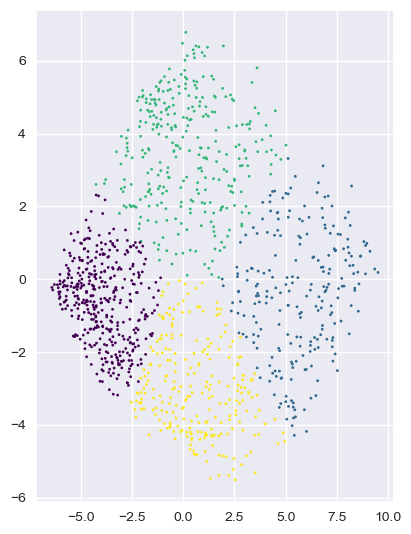

In [169]:
K = 4
cmap = plt.get_cmap('Set3', K)

gmm = GaussianMixture(n_components=K, n_init=3)
clusters_gmm_heures = gmm.fit_predict(data_heures_pca)

# --- #

plt.subplot(1,2,1)
plt.scatter(data_heures_pca[:,0], data_heures_pca[:,1], c=clusters_gmm_heures, s=1, linewidths=1, cmap='viridis')
plt.grid(True)


plt.tight_layout()
plt.show()

In [ ]:
# Critère BIC

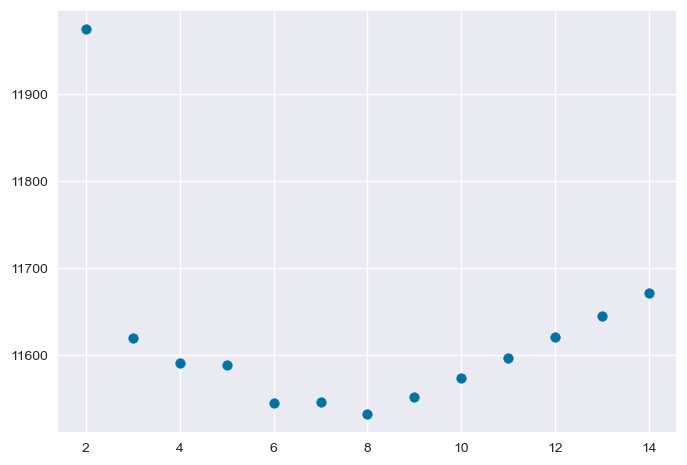

In [171]:
k_max = 15

bic = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=3)
    gmm.fit(data_heures_pcaa)
    bic.append(gmm.bic(data_heures_pca))
bic = np.array(bic)

plt.scatter(range(2, k_max), bic)
plt.show()

En appliquant le critère BIC on devrait garder entre 6 et 8 variables.

Comparons les deux méthodes de classifications : 

In [172]:
cm3_GMM, clusters_pca_sorted_heures_GMM = matchClasses(clusters_gmm_heures, clusters_heures_pca)


ConfusionMatrixDisplay(cm3_GMM).plot()

plt.xlabel('Kmeans sur les données heures réduites (PCA)')
plt.ylabel('Gmm sur les données heures réduites ')
plt.show()

df_kmeans_gmm3 = pd.DataFrame(cm3_GMM, columns=['groupe0', 'groupe1','groupe2', 'groupe3'], index=['groupe_pca0', 'groupe_pca1','groupe_pca2', 'groupe_pca3'])
df_kmeans_gmm3.head()

NameError: name 'matchClasses' is not defined

### 5.2. CA : comparaison méthodes de clustering

## 6. MCA sur data_heures

### 6.1. MCA

Pour appliquer la MCA, on seuille les données continues de data_heures pour les transformer en données qualitatives

In [ ]:
# Définition des intervalles
intervalles = [0, 0.2, 0.6, 1]

# Noms des seuils:
noms_des_seuils = ['-', '=', '+']

#nouveau data_frame :
loading_quali_heures = data_heures.copy(deep=True)

# Transformation des données continues en catégories avec des noms spécifiques
for colonne in loading_quali_heures.columns :
    loading_quali_heures[colonne] = pd.cut(loading_quali_heures[colonne], bins=intervalles, labels=noms_des_seuils, include_lowest=True)

# Rajout d'une colonne pour signaler l'altitude
loading_quali_heures['Hill'] = coord['bonus'].map({0: 'FAUX', 1: 'VRAI'})

display(loading_quali_heures)

In [181]:
# Calcul MCA
mca3 = prince.MCA(
    n_components=21,  # Le nombre de composantes voulues pour l'AMC
    n_iter=10,  
    copy=True,  
    check_input=True, 
    engine='sklearn',  
    random_state=42  
)

# Adapter le modèle 
mca3 = mca3.fit(loading_quali_heures)

# Transformer les données
loading_heures_mca = mca3.transform(loading_quali_heures)

# Affichage des résultats
print(loading_heures_mca)

            0         1         2         3         4         5         6   \
1    -0.541657 -0.761758  0.391485 -0.531368  0.348611  0.113261 -0.327380   
2     0.524918 -0.302272 -0.913637 -0.569624  0.097451  0.127308 -0.060155   
3     0.102809 -0.824374  0.670160  0.667100  0.036148  0.059299 -0.140037   
4     0.253121 -0.002614  1.107306 -0.165924  0.078111 -0.433519 -0.134175   
5     0.273459 -0.060641  1.211371 -0.217947  0.214658 -0.053600  0.050266   
...        ...       ...       ...       ...       ...       ...       ...   
1185 -0.844438 -0.392375  0.041013 -0.546171 -0.422585 -0.130878 -0.019361   
1186  0.248549 -0.393038  0.950663  0.194249  0.134437 -0.573868 -0.360713   
1187 -0.281432 -0.783830  0.473105  0.214043 -0.189865  0.186936  0.472334   
1188  0.284953 -0.188378  1.084295 -0.109251  0.159817  0.087094  0.065600   
1189  0.264489 -0.027466  1.239935 -0.221211  0.266126 -0.257933 -0.074978   

            7         8         9   ...        11        12    

In [ ]:
## inertie portée par chaque composante
display(mca3.eigenvalues_summary)
mca3.scree_plot ()

D'après les résultats précédents, pour expliquer 80% de la variance il faudrait garder 7 composantes de l'AMC. Ce résultat se retrouver ici, dans le graphique suivant où l'on observe un changement de tendance de la courbe entre 6 et 8.

In [ ]:
# Visualisation du graphe du coude
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(mca3.eigenvalues_) + 1), mca3.eigenvalues_, 'o-', color='pink')
plt.title('Scree Plot')
plt.xlabel('Dimentions')
plt.ylabel('Valeurs Propres')
plt.xticks(range(1, len(mca3.eigenvalues_) + 1))
plt.grid(True)
plt.show()

In [ ]:
## visualisation des résultats de la mca

In [123]:
mca3 = prince.MCA(n_components = 7)
mca3 = mca3.fit(loading_quali_heures)

mca3.plot(
    loading_quali_heures,
    x_component=0,
    y_component=1,
    show_column_markers=True,
    show_row_markers=True,
    show_column_labels=True,
    show_row_labels=False
)

alt.LayerChart(...)

On peut voir que les stations en altitude sont négativement corrélées à la dimension 1 et se retrouvent avec les stations peu chargées en moyenne.

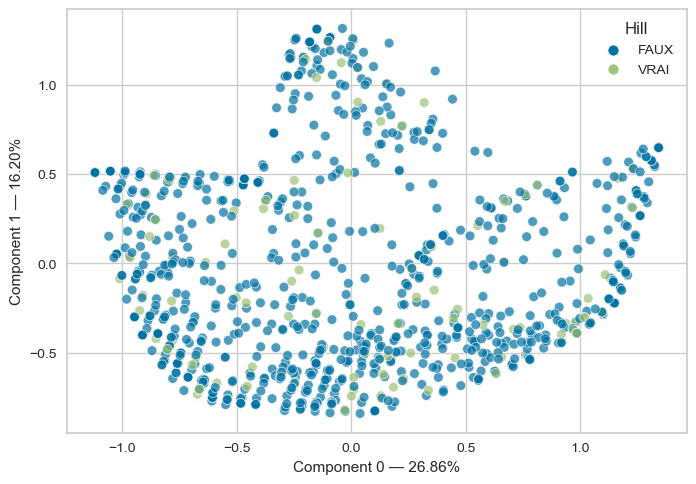

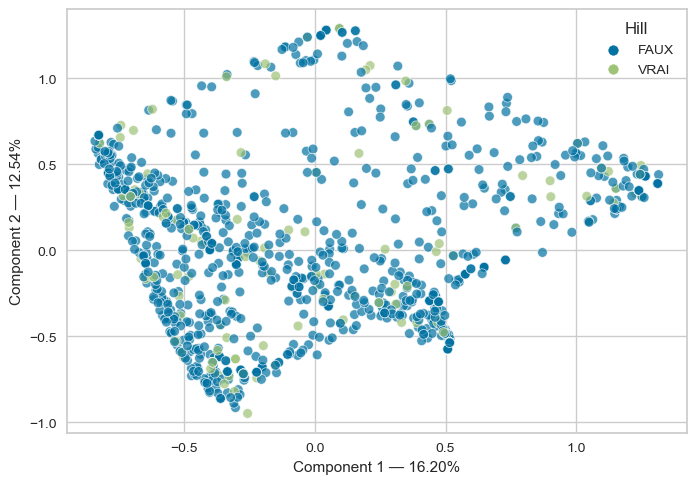

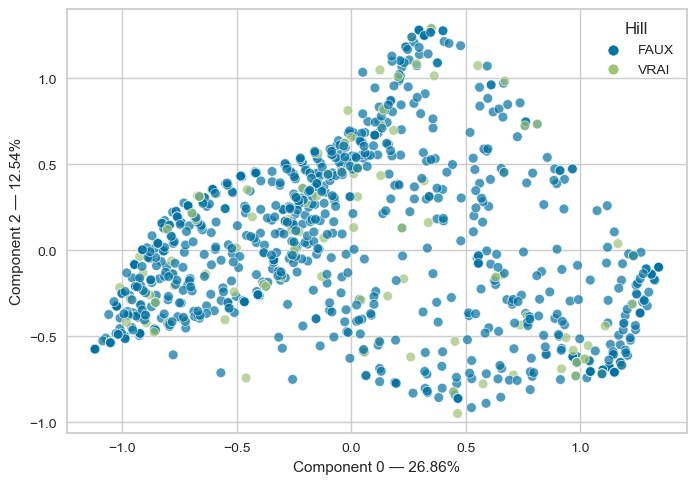

In [124]:
plot_mca(mca3, loading_quali_heures,0,1)
plot_mca(mca3, loading_quali_heures,1,2)
plot_mca(mca3, loading_quali_heures,0,2)

Quelles variables contribuent le plus aux axes ? Trouve-t-on un comportement général ?

In [ ]:
contrib3 = mca3.column_contributions_.style.format('{:.1%}')
display(contrib3.highlight_max(color='orange').highlight_min(color='lightblue'))

In [ ]:
contrib3 = mca3.column_contributions_.iloc[:, :3]
print("-------contribution > 0.025 pour comp0---------")
contrib3_C0 = contrib3.iloc[:, 0]
C0_filtrée = contrib3_C0[contrib3_C0 > 0.025]
display(C0_filtrée)

print("-------contribution > 0.025 pour comp1---------")
contrib3_C1 = contrib3.iloc[:, 0]
C1_filtrée = contrib3_C1[contrib3_C1 > 0.02]
display(C1_filtrée)

print("-------contribution > 0.025 pour comp2---------")
contrib3_C2 = contrib3.iloc[:, 2]
C2_filtrée = contrib3_C2[contrib3_C2 > 0.025]
display(C2_filtrée)

On peut voir que pour la composante 1, c'est les heures de nuit chargées qui contribuent fortement. Pour la composante 2, plutôt les heures de journée et de nuit faiblement chargées et pour la composante 3 les heures de nuits moyennement chargées.

Avant de faire quelconques conclusions, il faut vérifier la qualité de représentation des variables dans l'espace factoriel.

In [182]:
# Qualité de représentation
mca3.column_cosine_similarities(loading_quali_heures)

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
Minuit_-,0.422277,0.223921,0.032828,0.038241,0.041958,0.041036,0.002480,0.025841,1.158586e-02,0.009985,...,0.001337,0.025482,0.004590,0.002401,0.003207,0.014812,0.012966,0.005197,0.001946,0.001988
Minuit_=,0.004803,0.198545,0.320369,0.000253,0.122214,0.031093,0.014069,0.080651,1.580188e-02,0.024652,...,0.017351,0.009525,0.000128,0.002635,0.020769,0.007335,0.027673,0.014321,0.000021,0.000038
Minuit_+,0.588821,0.001291,0.162412,0.050940,0.022386,0.000935,0.031767,0.016277,3.059950e-04,0.003449,...,0.009954,0.004582,0.007110,0.011334,0.008354,0.001581,0.002881,0.002412,0.002703,0.001691
1h_-,0.357050,0.318099,0.029903,0.077119,0.006735,0.014340,0.000140,0.020126,2.009842e-02,0.022264,...,0.000839,0.001934,0.015546,0.002621,0.004826,0.001478,0.000148,0.017682,0.003797,0.000134
1h_=,0.018089,0.237211,0.371503,0.006071,0.010324,0.025613,0.011925,0.063971,2.620079e-02,0.045672,...,0.004675,0.000069,0.013271,0.009159,0.003754,0.006143,0.000599,0.026552,0.000017,0.000190
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23h_-,0.442071,0.167176,0.026966,0.019917,0.094539,0.063614,0.014028,0.017031,7.035872e-05,0.000307,...,0.000982,0.037091,0.000269,0.004381,0.007444,0.005754,0.000008,0.006753,0.001804,0.002919
23h_=,0.002772,0.180289,0.246288,0.002678,0.278462,0.017485,0.009991,0.045226,1.961572e-08,0.000536,...,0.000343,0.014161,0.017202,0.000682,0.038450,0.004247,0.000088,0.016849,0.014053,0.000023
23h_+,0.589762,0.000055,0.118977,0.042271,0.050335,0.017305,0.053770,0.006947,8.350650e-05,0.000030,...,0.002813,0.006646,0.014427,0.001895,0.012849,0.000166,0.000164,0.002321,0.006227,0.003968
Hill_FAUX,0.141418,0.001100,0.020710,0.021856,0.030408,0.004712,0.008424,0.016134,4.721547e-01,0.248800,...,0.006002,0.014180,0.000053,0.000094,0.001881,0.000283,0.000015,0.000055,0.000169,0.000043


Ces valeurs vont de 0 (moins bonne représentation) à 1. Pour les composantes 0, 1 et 2 les valeurs du cos2 sont plutot importantes donc on peut dire que oui, les variables sont bien représenté dans le plan d'amc 0, 1 et 2.

### 5.2. Méthode de clustering K-means

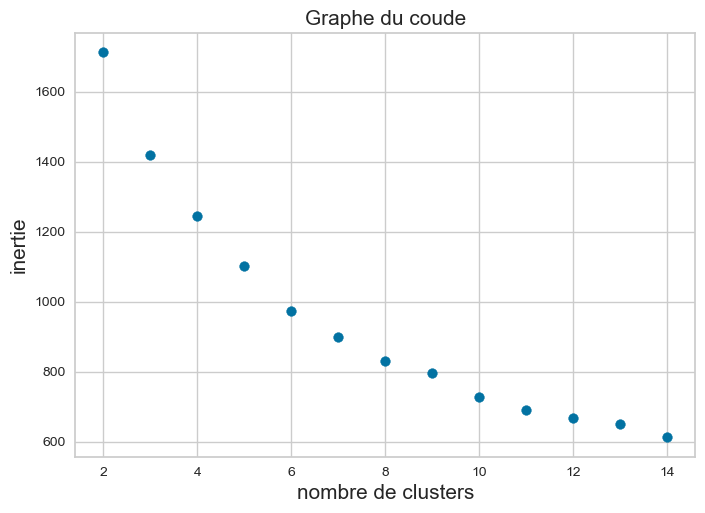

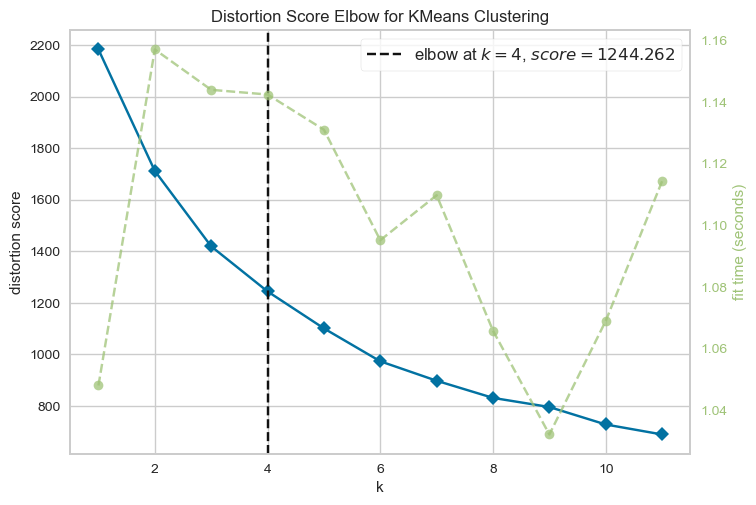

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [132]:
inertia = []
for k in range(1, 15):
    kmeans_mca3 = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    kmeans_mca3.fit(loading_heures_mca)
    inertia.append(kmeans_mca3.inertia_)

inertia = np.array(inertia)


plt.scatter(range(2, 15), inertia[1:])
plt.xlabel('nombre de clusters', fontsize = 15)
plt.ylabel('inertie', fontsize = 15)
plt.title("Graphe du coude", fontsize = 15)
plt.show()


# --- #


# Using yellowbrick

kmeans_mca3 = KMeans(init='random', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans_mca3, k=(1,12))

visualizer.fit(loading_heures_mca)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

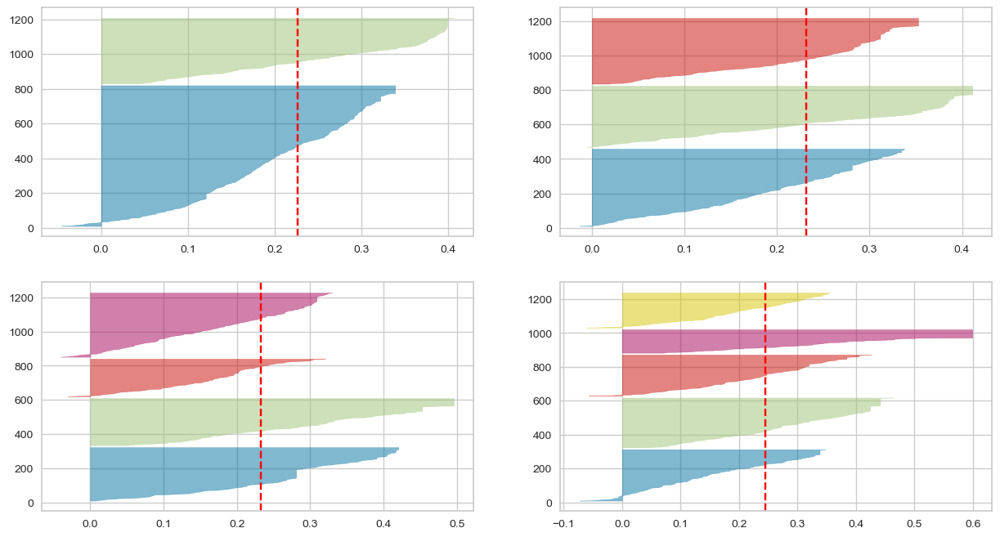

In [133]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))

for k in range(2, 6):
    kmeans_mca3 = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100, random_state=42)
    q, mod = divmod(k, 2) 
    # Create SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(kmeans_mca3, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(loading_heures_mca)

Comme pour le clustering K-means sur les données PCA, on trouve ici que le nombre idéal de clusters est 3 ou 4. On penche plus vers 4 pour voir si l'analyse avec PCA ou avec MCA est comparable.

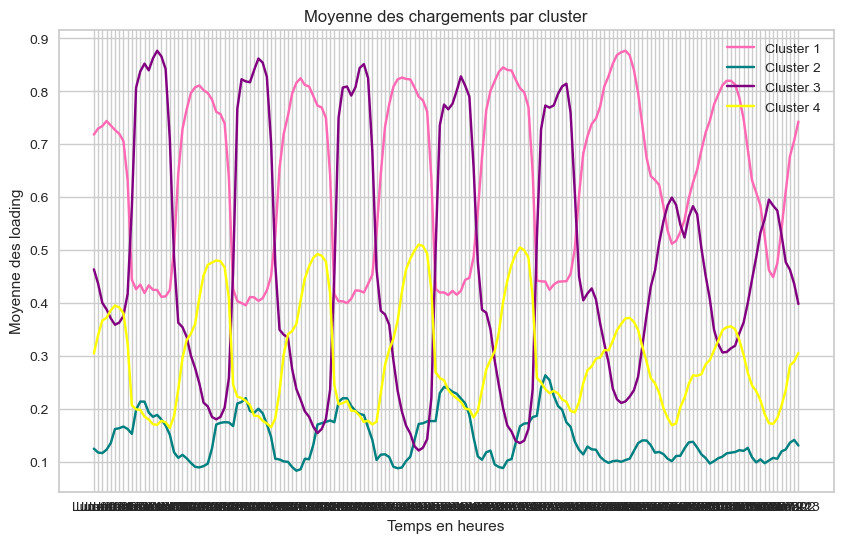

In [151]:
kmeans_mca3 = KMeans(n_clusters=4, init='random', n_init='auto', max_iter=100, random_state=42)
clusters_mca3 = kmeans_mca3.fit_predict(loading_heures_mca)
loading_sub_mca3 = loading.iloc[:,:]
loading_sub_mca3['cluster']=clusters_mca3
mean_loading_mca3=loading_sub_mca3.groupby('cluster').mean()
mean_loading_mca3.head()

fig, ax = plt.subplots(figsize=(10, 6))

col= ['#FF69B4', '#008080'  ,'#800080','#FFFF00']

# Affichage des 4 lignes sur le même graphique
for i in range(4):
    ax.plot(mean_loading_mca3.columns, mean_loading_mca3.iloc[i], label=f'Cluster {i+1}', color=col[i])

plt.legend()
plt.title('Moyenne des chargements par cluster')
plt.xlabel('Temps en heures')
plt.ylabel('Moyenne des loading')
plt.show()


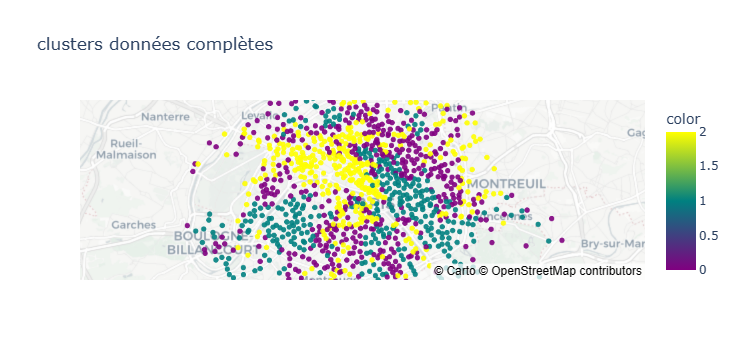

In [138]:
f1 = px.scatter_mapbox(clusters_mca3, Position[:,1], Position[:,0], color=clusters_mca3, color_continuous_scale=[(0, '#800080'), (0.5, '#008080'), (1, '#FFFF00')], 
                        size_max=15, zoom=10,mapbox_style="carto-positron", opacity = .9,
                        title = 'clusters données complètes')

f1.show()

### 5.3. GMM

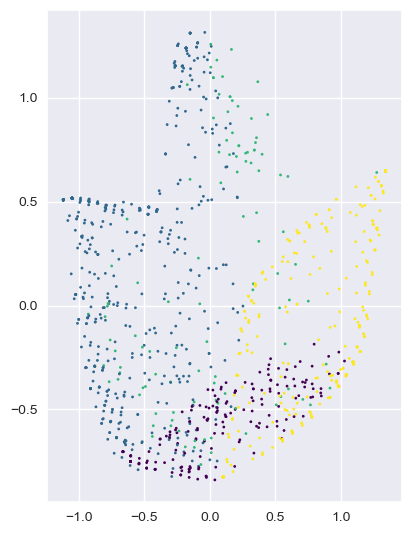

In [173]:
K = 4
cmap = plt.get_cmap('Set3', K)

gmm = GaussianMixture(n_components=K, n_init=4)
clusters_gmm_heures_mca = gmm.fit_predict(loading_heures_mca)

# --- #

plt.subplot(1,2,1)
plt.scatter(loading_heures_mca.iloc[:,0], loading_heures_mca.iloc[:,1], c=clusters_gmm_heures_mca, s=1, linewidths=1, cmap='viridis')
plt.grid(True)


plt.tight_layout()
plt.show()

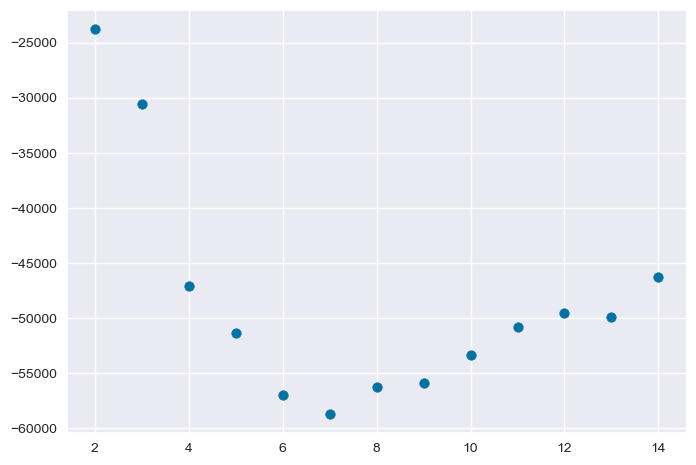

In [159]:
k_max = 15

bic = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=3)
    gmm.fit(loading_heures_mca)
    bic.append(gmm.bic(loading_heures_mca))
bic = np.array(bic)

plt.scatter(range(2, k_max), bic)
plt.show()

Avec cette méthode on devrait garder entre 6 et 8 variables.

In [126]:
def def_pred_station(coord1, coord2) :
    min_distance = 1000
    r = 1
    for i in range(coord.shape[0]):
        distance = np.sqrt((coord1 - coord[i, 0])**2 + (coord2 - coord[i, 1])**2)
        if distance < min_distance:
            min_distance = distance
            r = i
            
    result = reskmeans.cluster[r]
    return result

def_pred_station(2.35 , 48.45)

KeyError: (0, 0)

## 7. Conclusion

Dans ce projet, on a remarqué que le profil de chargement d'une station dépend de sa localisation. Le chargement varie surtout en fonction des heures de la journée mais un peu moins entre le week-end et la semaine. \
Dans nos méthodes de clustering K-Means et CAH, on a repéré 4 types de stations : les stations qui se chargent en journée et qui se vident en soirée, qui correspondent aux zones de travail. Ces stations sont également en moyenne moins chargées et peu moins active le week-end. \
Les stations qui elles se chargent en soirée et se vide le matin : elles correspondent aux zones d'habitation. Leur chargement reste élevé le week-end et varie moins car les gens n'ont pas besoin de se rendre à leur lieu de travail. \
Enfin, 2 autres types de clusters : les stations avec un chargement élevé en moyenne mais dont le chargement ne varie pas beaucoup et les stations avec un chargement faible en moyenne et dont le chargement ne varie pas beaucoup. On a vu que les stations en altitude sont en majorité dans ce dernier cluster. Ces deux clusters correspondent aux stations moins empruntées. \
Le GMM lui nous rend en moyenne 2/3 clusters : il différencie les stations par leur chargement moyen et non pas par la variabilité de leur chargement.